
===== CELL A — ROOT PORTABLE EXTRACTION =====
User inputs loaded successfully.
SESSION_FOLDER: D:\Kevin\04032026
NI_TTL_FOLDER: G:\Kevin\2026-03-04_08-31-33\Record Node 104\experiment1\recording1\events\NI-DAQmx-103.PXIe-6341\TTL
PROBEA_PATH: G:\Kevin\2026-03-04_08-31-33\Record Node 101\experiment1\recording1\continuous\Neuropix-PXI-100.ProbeA\kilosort4
CAMERA_TTL_PIN: 1

Analysis folder created: G:\Kevin\2026-03-04_08-31-33\Record Node 104\Record Node 104_analysis_3
Loaded NI-DAQ data: 543620 samples
Saved 134516 TTLs for pin 0
Saved 134517 TTLs for pin 1
Saved 0 TTLs for pin 2
Saved 141 TTLs for pin 3
Saved 71 TTLs for pin 4
Saved 2447 TTLs for pin 5
Saved 47 TTLs for pin 6
Saved 71 TTLs for pin 7
Saved TTL metadata.

===== TTL BLOCK DETECTOR =====
Detected 134517 rising edges on camera pin 1

Block 0:
  TTLs: 134517
  Start: 69.923s
  End:   2312.969s


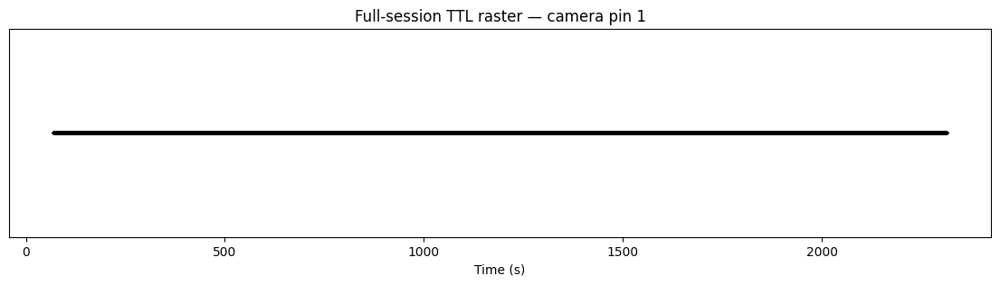


===== TTL BLOCK DETECTOR COMPLETE =====

===== QC CHECK: Firing-rate matrix =====
QC files missing — computing...
Loaded 100 good units.
Found 290 noise units total.
Using 20 sampled noise units.
Saved rate_matrix → G:\Kevin\2026-03-04_08-31-33\Record Node 104\Record Node 104_analysis_3\qc\rate_matrix.npy
Saved noise_rate_matrix → G:\Kevin\2026-03-04_08-31-33\Record Node 104\Record Node 104_analysis_3\qc\noise_rate_matrix.npy

===== QC COMPLETE =====



In [3]:
# ============================================================
# =======================  CELL A  ============================
# ========== ROOT CELL — TTLs + QC + PORTABLE SPIKES =========
# ============================================================

import os
import json
import numpy as np
import pandas as pd
from pathlib import Path
import matplotlib.pyplot as plt
from scipy.ndimage import gaussian_filter1d

print("\n===== CELL A — ROOT PORTABLE EXTRACTION =====")

# ------------------------------------------------------------
# USER INPUTS  ###############################################
# ------------------------------------------------------------

SESSION_FOLDER = r"D:\Kevin\04032026"   ###########################################################################################################################
NI_TTL_FOLDER = r"G:\Kevin\2026-03-04_08-31-33\Record Node 104\experiment1\recording1\events\NI-DAQmx-103.PXIe-6341\TTL"  #########################################
PROBEA_PATH = r"G:\Kevin\2026-03-04_08-31-33\Record Node 101\experiment1\recording1\continuous\Neuropix-PXI-100.ProbeA\kilosort4"  ##############################################

CAMERA_TTL_PIN = 1   ###########################################################################################################################################
EXPECTED_RATE_HZ = 60 ###########################################################################################################################
MISSING_TTL_THRESHOLD = 60 #######################################################################################################################################
MIN_BLOCK_LENGTH = 1000 ###############################################################################################################################################

# ---- Regex pattern for camera filenames ----
# Example: frame_030293_cnt_1575696.raw
FILENAME_PATTERN = r"frame_(\d+)_cnt_(\d+)\.raw" ################################################################################################################################################

print("User inputs loaded successfully.")
print(f"SESSION_FOLDER: {SESSION_FOLDER}")
print(f"NI_TTL_FOLDER: {NI_TTL_FOLDER}")
print(f"PROBEA_PATH: {PROBEA_PATH}")
print(f"CAMERA_TTL_PIN: {CAMERA_TTL_PIN}")

# ------------------------------------------------------------
# BUILD ANALYSIS FOLDER (AUTO-INCREMENT)
# ------------------------------------------------------------

session_root = Path(NI_TTL_FOLDER).parents[4]
session_name = session_root.name

base_name = f"{session_name}_analysis"
analysis_folder = session_root / base_name

counter = 1
while analysis_folder.exists():
    analysis_folder = session_root / f"{base_name}_{counter}"
    counter += 1

analysis_folder.mkdir()

for sf in ["camera_alignment", "dlc_alignment", "behavior_ttls", "metadata", "qc", "ttls", "spikes"]:
    (analysis_folder / sf).mkdir(exist_ok=True)

print(f"\nAnalysis folder created: {analysis_folder}")

# ------------------------------------------------------------
# LOAD NI-DAQ TTL STREAM
# ------------------------------------------------------------

timestamps_ni = np.load(os.path.join(NI_TTL_FOLDER, "timestamps.npy"))
full_words_ni = np.load(os.path.join(NI_TTL_FOLDER, "full_words.npy"))

print(f"Loaded NI-DAQ data: {len(full_words_ni)} samples")

# ------------------------------------------------------------
# EXTRACT TTLs FOR ALL PINS (0–7)
# ------------------------------------------------------------

def extract_rising_edges(full_words, timestamps, pin):
    mask = 1 << pin
    bit_on = (full_words & mask) > 0
    bit_prev = np.roll(bit_on, 1)
    bit_prev[0] = False
    rising = (~bit_prev) & bit_on
    return timestamps[rising]

ttls_dir = analysis_folder / "ttls"

all_pin_ttls = {}
for pin in range(8):
    ttls = extract_rising_edges(full_words_ni, timestamps_ni, pin)
    all_pin_ttls[pin] = ttls
    np.save(ttls_dir / f"TTL_Pin_{pin}.npy", ttls)
    print(f"Saved {len(ttls)} TTLs for pin {pin}")

# Save NI timing metadata
ni_meta = {
    "pins": list(range(8)),
    "camera_ttl_pin_used_for_blocks": int(CAMERA_TTL_PIN),
    "ni_start_time": float(timestamps_ni[0]),
    "ni_end_time": float(timestamps_ni[-1]),
    "expected_rate_hz": EXPECTED_RATE_HZ,
    "missing_ttl_threshold": MISSING_TTL_THRESHOLD,
    "min_block_length": MIN_BLOCK_LENGTH,
}
with open(analysis_folder / "metadata" / "ttl_metadata.json", "w") as f:
    json.dump(ni_meta, f, indent=2)

print("Saved TTL metadata.")

# ------------------------------------------------------------
# TTL BLOCK DETECTION (CAMERA PIN)
# ------------------------------------------------------------

print("\n===== TTL BLOCK DETECTOR =====")

rising_times = all_pin_ttls[CAMERA_TTL_PIN]
print(f"Detected {len(rising_times)} rising edges on camera pin {CAMERA_TTL_PIN}")

ipi = np.diff(rising_times)
expected_ipi = 1.0 / EXPECTED_RATE_HZ
gap_threshold = expected_ipi * MISSING_TTL_THRESHOLD

gap_mask = ipi > gap_threshold
gap_indices = np.where(gap_mask)[0]

block_starts = np.insert(gap_indices + 1, 0, 0)
block_ends   = np.append(gap_indices, len(rising_times) - 1)

ttl_blocks = []
block_info = []

for b, (start, end) in enumerate(zip(block_starts, block_ends)):
    block_len = end - start + 1
    if block_len < MIN_BLOCK_LENGTH:
        print(f"Skipping block {b} (too short: {block_len})")
        continue

    block_times = rising_times[start:end+1]
    ttl_blocks.append(block_times)

    info = {
        "block_index": b,
        "ttl_start_index": int(start),
        "ttl_end_index": int(end),
        "n_ttls": int(block_len),
        "start_time_sec": float(block_times[0]),
        "end_time_sec": float(block_times[-1]),
        "duration_sec": float(block_times[-1] - block_times[0]),
        "gap_threshold_sec": float(gap_threshold),
        "camera_ttl_pin": int(CAMERA_TTL_PIN),
    }
    block_info.append(info)

    print(f"\nBlock {b}:")
    print(f"  TTLs: {block_len}")
    print(f"  Start: {block_times[0]:.3f}s")
    print(f"  End:   {block_times[-1]:.3f}s")

# Save block info
with open(analysis_folder / "metadata" / "block_info.json", "w") as f:
    json.dump(block_info, f, indent=2)

# Save TTL blocks
cam_align_dir = analysis_folder / "camera_alignment"
for b, block_times in enumerate(ttl_blocks):
    np.save(cam_align_dir / f"ttl_times_block{b}.npy", block_times)

# Plot full-session raster
plt.figure(figsize=(14, 3))
plt.scatter(rising_times, np.zeros_like(rising_times), s=2, c='k')
plt.title(f"Full-session TTL raster — camera pin {CAMERA_TTL_PIN}")
plt.xlabel("Time (s)")
plt.yticks([])
plt.show()

print("\n===== TTL BLOCK DETECTOR COMPLETE =====")

# ------------------------------------------------------------
# QC COMPUTATION (SPIKES + RATE MATRIX + NOISE UNITS)
# ------------------------------------------------------------

print("\n===== QC CHECK: Firing-rate matrix =====")

qc_dir = analysis_folder / "qc"
spikes_dir = analysis_folder / "spikes"

rate_path = qc_dir / "rate_matrix.npy"
good_units_path = qc_dir / "good_units.npy"
centers_path = qc_dir / "centers.npy"
duration_path = qc_dir / "recording_duration.json"
noise_units_path = qc_dir / "noise_units.npy"
noise_rate_path = qc_dir / "noise_rate_matrix.npy"

if rate_path.exists() and good_units_path.exists() and centers_path.exists() and duration_path.exists() and noise_units_path.exists() and noise_rate_path.exists():
    print("QC files already exist — skipping computation.")
else:
    print("QC files missing — computing...")

    # Load spike times
    spike_times = np.load(Path(PROBEA_PATH) / "spike_times.npy") / 30000.0
    spike_clusters = np.load(Path(PROBEA_PATH) / "spike_clusters.npy")

    # Load cluster info
    df_info = pd.read_csv(Path(PROBEA_PATH) / "cluster_info.tsv", sep="\t")

    # Your pipeline uses:
    cluster_id_col = "id"
    group_col = "group"

    # ---------------- GOOD UNITS ----------------
    good_units = df_info[df_info[group_col] == "good"][cluster_id_col].values
    np.save(good_units_path, good_units)
    print(f"Loaded {len(good_units)} good units.")

    # Save portable spike times for good units
    for unit in good_units:
        unit_spikes = spike_times[spike_clusters == unit]
        np.save(spikes_dir / f"unit_{unit}.npy", unit_spikes)

    # ---------------- NOISE UNITS ----------------
    noise_units = df_info[df_info[group_col] == "noise"][cluster_id_col].values
    print(f"Found {len(noise_units)} noise units total.")

    np.random.seed(0)
    if len(noise_units) > 20:
        sampled_noise_units = np.random.choice(noise_units, size=20, replace=False)
    else:
        sampled_noise_units = noise_units

    sampled_noise_units = np.array(sampled_noise_units)
    np.save(noise_units_path, sampled_noise_units)
    print(f"Using {len(sampled_noise_units)} sampled noise units.")

    # Save portable spike times for noise units
    for unit in sampled_noise_units:
        unit_spikes = spike_times[spike_clusters == unit]
        np.save(spikes_dir / f"noise_unit_{unit}.npy", unit_spikes)

    # ---------------- TIME BINS ----------------
    recording_duration = float(spike_times.max())
    bin_size = 0.02
    bins = np.arange(0, recording_duration + bin_size, bin_size)
    centers = bins[:-1] + bin_size/2

    np.save(centers_path, centers)
    with open(duration_path, "w") as f:
        json.dump({"recording_duration": recording_duration}, f)

    # ---------------- RATE MATRIX (GOOD UNITS) ----------------
    rate_matrix = np.zeros((len(good_units), len(centers)), float)

    for i, unit in enumerate(good_units):
        unit_spikes = spike_times[spike_clusters == unit]
        hist, _ = np.histogram(unit_spikes, bins=bins)
        rate_matrix[i, :] = gaussian_filter1d(hist.astype(float), sigma=2)

    np.save(rate_path, rate_matrix)
    print(f"Saved rate_matrix → {rate_path}")

    # ---------------- RATE MATRIX (NOISE UNITS) ----------------
    noise_rate_matrix = np.zeros((len(sampled_noise_units), len(centers)), float)

    for i, unit in enumerate(sampled_noise_units):
        unit_spikes = spike_times[spike_clusters == unit]
        hist, _ = np.histogram(unit_spikes, bins=bins)
        noise_rate_matrix[i, :] = gaussian_filter1d(hist.astype(float), sigma=2)

    np.save(noise_rate_path, noise_rate_matrix)
    print(f"Saved noise_rate_matrix → {noise_rate_path}")

print("\n===== QC COMPLETE =====\n")


===== TTL BLOCK DETECTOR =====
Detected 134517 rising edges on camera pin 1

Detected 1 TTL blocks (before filtering)

Block 0:
  TTLs: 134517
  Start time: 69.923s
  End time:   2312.969s
  Duration:   2243.046s

Saved block_info.json → G:\Kevin\2026-03-04_08-31-33\Record Node 104\Record Node 104_analysis_3\metadata\block_info.json
Saved TTL block 0 → G:\Kevin\2026-03-04_08-31-33\Record Node 104\Record Node 104_analysis_3\camera_alignment\ttl_times_block0.npy


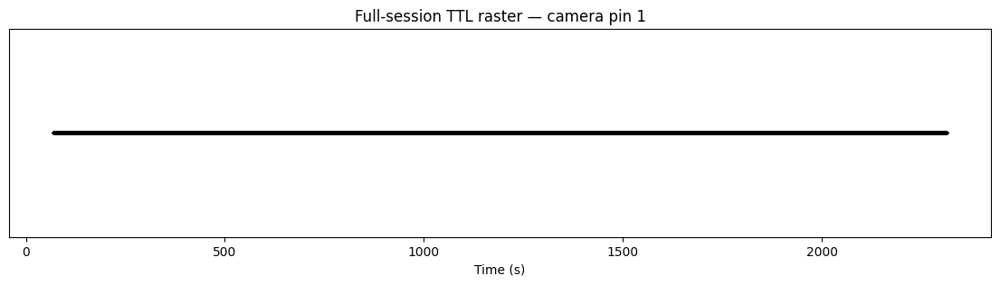

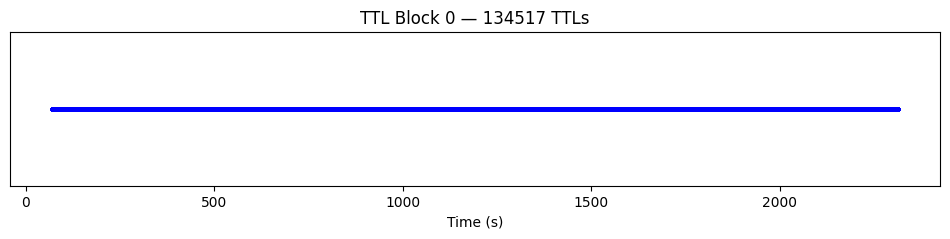


===== TTL BLOCK DETECTOR COMPLETE =====



In [4]:
# ============================================================
# CELL B — TTL BLOCK DETECTOR (CAMERA PIN)
# ============================================================

print("\n===== TTL BLOCK DETECTOR =====")

# Use TTLs from the chosen camera pin for block detection
rising_times = all_pin_ttls[CAMERA_TTL_PIN]
print(f"Detected {len(rising_times)} rising edges on camera pin {CAMERA_TTL_PIN}")

ipi = np.diff(rising_times)
expected_ipi = 1.0 / EXPECTED_RATE_HZ
gap_threshold = expected_ipi * MISSING_TTL_THRESHOLD

gap_mask = ipi > gap_threshold
gap_indices = np.where(gap_mask)[0]

block_starts = np.insert(gap_indices + 1, 0, 0)
block_ends   = np.append(gap_indices, len(rising_times) - 1)

print(f"\nDetected {len(block_starts)} TTL blocks (before filtering)")

ttl_blocks = []
block_info = []

for b, (start, end) in enumerate(zip(block_starts, block_ends)):
    block_len = end - start + 1

    if block_len < MIN_BLOCK_LENGTH:
        print(f"Skipping block {b} (too short: {block_len} TTLs)")
        continue

    block_times = rising_times[start:end+1]
    ttl_blocks.append(block_times)

    info = {
        "block_index": b,
        "ttl_start_index": int(start),
        "ttl_end_index": int(end),
        "n_ttls": int(block_len),
        "start_time_sec": float(block_times[0]),
        "end_time_sec": float(block_times[-1]),
        "duration_sec": float(block_times[-1] - block_times[0]),
        "gap_threshold_sec": float(gap_threshold),
        "camera_ttl_pin": int(CAMERA_TTL_PIN),
    }
    block_info.append(info)

    print(f"\nBlock {b}:")
    print(f"  TTLs: {block_len}")
    print(f"  Start time: {block_times[0]:.3f}s")
    print(f"  End time:   {block_times[-1]:.3f}s")
    print(f"  Duration:   {block_times[-1] - block_times[0]:.3f}s")

metadata_path = analysis_folder / "metadata" / "block_info.json"
with open(metadata_path, "w") as f:
    json.dump(block_info, f, indent=2)

print(f"\nSaved block_info.json → {metadata_path}")

ttl_dir = analysis_folder / "camera_alignment"
ttl_dir.mkdir(exist_ok=True)

for b, block_times in enumerate(ttl_blocks):
    out_path = ttl_dir / f"ttl_times_block{b}.npy"
    np.save(out_path, block_times)
    print(f"Saved TTL block {b} → {out_path}")

# Full-session raster for camera pin
plt.figure(figsize=(14, 3))
plt.scatter(rising_times, np.zeros_like(rising_times), s=2, c='k')
plt.title(f"Full-session TTL raster — camera pin {CAMERA_TTL_PIN}")
plt.xlabel("Time (s)")
plt.yticks([])
plt.show()

# Each block raster
for b, block_times in enumerate(ttl_blocks):
    plt.figure(figsize=(12, 2))
    plt.scatter(block_times, np.zeros_like(block_times), s=3, c='blue')
    plt.title(f"TTL Block {b} — {len(block_times)} TTLs")
    plt.xlabel("Time (s)")
    plt.yticks([])
    plt.show()

print("\n===== TTL BLOCK DETECTOR COMPLETE =====\n")

In [7]:
# ============================================================
# =============== CELL C — CAMERA MAPPING ================
# ============================================================

import os
import json

print("\n===== CAMERA FOLDER MAPPING =====")
print(f"Detected {len(ttl_blocks)} TTL blocks.")
print("Define CAM_FOLDERS mapping manually.\n")

# ---- MANUAL MAPPING: block index → camera folder ----
CAM_FOLDERS = {
    0: r"D:\Kevin\04032026\04032026-1\cam2", ####################################################################################################
  
}

if len(CAM_FOLDERS) != len(ttl_blocks):
    raise ValueError("❌ CAM_FOLDERS count mismatch.")

expected = set(range(len(ttl_blocks)))
if set(CAM_FOLDERS.keys()) != expected:
    raise ValueError("❌ CAM_FOLDERS keys do not match block indices.")

for b, path in CAM_FOLDERS.items():
    if not os.path.isdir(path):
        raise FileNotFoundError(f"❌ Camera folder for block {b} not found:\n{path}")

print("\n✅ Camera folders mapped successfully:")
for b, path in CAM_FOLDERS.items():
    print(f"  Block {b} → {path}")

camera_map_path = analysis_folder / "metadata" / "camera_mapping.json"
with open(camera_map_path, "w") as f:
    json.dump(CAM_FOLDERS, f, indent=2)

print(f"\nSaved camera mapping → {camera_map_path}")


===== CAMERA FOLDER MAPPING =====
Detected 1 TTL blocks.
Define CAM_FOLDERS mapping manually.


✅ Camera folders mapped successfully:
  Block 0 → D:\Kevin\04032026\04032026-1\cam2

Saved camera mapping → G:\Kevin\2026-03-04_08-31-33\Record Node 104\Record Node 104_analysis_3\metadata\camera_mapping.json


In [8]:
# ============================================================
# =============== CELL D — DLC OUTPUT MAPPING ============
# ============================================================

import os
import json

print("\n===== DLC OUTPUT MAPPING =====")
print(f"Detected {len(ttl_blocks)} TTL blocks.")
print("Define DLC_OUTPUTS mapping manually.\n")

# ---- MANUAL MAPPING: block index → DLC output file ----
DLC_OUTPUTS = {
    0: r"G:\Kevin\2026-03-04_08-31-33\04032026-1_cam2DLC_Resnet50_03042026_Cam2May5shuffle1_snapshot_best-40.h5" ####################################################################################################
}

if len(DLC_OUTPUTS) != len(ttl_blocks):
    raise ValueError("❌ DLC_OUTPUTS count mismatch.")

expected = set(range(len(ttl_blocks)))
if set(DLC_OUTPUTS.keys()) != expected:
    raise ValueError("❌ DLC_OUTPUTS keys do not match block indices.")

for b, path in DLC_OUTPUTS.items():
    if not os.path.isfile(path):
        raise FileNotFoundError(f"❌ DLC file for block {b} not found:\n{path}")

print("\n✅ DLC outputs mapped successfully:")
for b, path in DLC_OUTPUTS.items():
    print(f"  Block {b} → {path}")

dlc_map_path = analysis_folder / "metadata" / "dlc_mapping.json"
with open(dlc_map_path, "w") as f:
    json.dump(DLC_OUTPUTS, f, indent=2)

print(f"\nSaved DLC mapping → {dlc_map_path}")


===== DLC OUTPUT MAPPING =====
Detected 1 TTL blocks.
Define DLC_OUTPUTS mapping manually.


✅ DLC outputs mapped successfully:
  Block 0 → G:\Kevin\2026-03-04_08-31-33\04032026-1_cam2DLC_Resnet50_03042026_Cam2May5shuffle1_snapshot_best-40.h5

Saved DLC mapping → G:\Kevin\2026-03-04_08-31-33\Record Node 104\Record Node 104_analysis_3\metadata\dlc_mapping.json


In [9]:
# ============================================================
# ====F= CELL E - CELL SESSION — BUILD SESSION ===============
# ============================================================

import json

print("\n===== BUILDING SESSION OBJECT =====")

session = {"blocks": []}

for block_index, ttl_times_block in enumerate(ttl_blocks):

    block = {
        "block_index": block_index,

        # TTLs (portable)
        "ttl_times": ttl_times_block.tolist(),

        # camera folder (only needed on camera workstation)
        "cam_folder": CAM_FOLDERS[block_index],

        # DLC path (only needed for DLC alignment)
        "dlc_path": DLC_OUTPUTS[block_index],

        # portable output paths
        "aligned_frames_path": str(analysis_folder / "camera_alignment" / f"aligned_frames_block{block_index}.npy"),
        "dlc_aligned_path": str(analysis_folder / "dlc_alignment" / f"dlc_aligned_block{block_index}.npy"),
    }

    session["blocks"].append(block)

session_path = analysis_folder / "metadata" / "session.json"
with open(session_path, "w") as f:
    json.dump(session, f, indent=2)

print(f"\nSaved session metadata → {session_path}")
print("Session object contains:")
for b in session["blocks"]:
    print(f"  Block {b['block_index']} | TTLs: {len(b['ttl_times'])}")


===== BUILDING SESSION OBJECT =====

Saved session metadata → G:\Kevin\2026-03-04_08-31-33\Record Node 104\Record Node 104_analysis_3\metadata\session.json
Session object contains:
  Block 0 | TTLs: 134517


In [10]:
# ============================================================
# ========== CELL G — FRAME ALIGNMENT FOR ALL BLOCKS ==========
# ============================================================

import os
import re
import numpy as np
from pathlib import Path

print("\n===== FRAME ALIGNMENT FOR ALL BLOCKS =====")

PATTERN = re.compile(FILENAME_PATTERN)

for block_index, block in enumerate(session["blocks"]):

    print(f"\n==============================")
    print(f"Processing block {block_index}")
    print("==============================")

    ttl_times_block = np.array(block["ttl_times"])
    CAM_FOLDER = block["cam_folder"]
    TTL_COUNT = len(ttl_times_block)

    print(f"TTL pulses in block: {TTL_COUNT}")
    print(f"Camera folder: {CAM_FOLDER}")

    entries = []

    for fname in os.listdir(CAM_FOLDER):
        m = PATTERN.match(fname)
        if m:
            frame_idx = int(m.group(1))
            counter   = int(m.group(2))
            entries.append((frame_idx, counter, fname))

    if not entries:
        raise RuntimeError(f"No valid frame files found in {CAM_FOLDER}")

    entries.sort(key=lambda x: x[1])

    frame_indices = np.array([e[0] for e in entries])
    counters      = np.array([e[1] for e in entries])
    filenames     = [e[2] for e in entries]

    print(f"Loaded {len(entries)} frames from camera folder")

    print("\n===== FRAME INTEGRITY CHECK =====")

    missing_frame_idx_total = 0
    missing_counter_total   = 0
    problems = []

    last_frame = None
    last_counter = None

    for frame_idx, counter, fname in entries:
        if last_frame is not None:

            expected_frame = last_frame + 1
            if frame_idx != expected_frame:
                gap = frame_idx - expected_frame
                missing_frame_idx_total += gap
                problems.append(
                    f"FRAME INDEX GAP: {last_frame} → {frame_idx} (missing {gap})"
                )

            expected_counter = last_counter + 1
            if counter != expected_counter:
                gap = counter - expected_counter
                missing_counter_total += gap
                problems.append(
                    f"CHUNK COUNTER GAP: {last_counter} → {counter} "
                    f"(missing {gap}) at frame {frame_idx} ({fname})"
                )

        last_frame = frame_idx
        last_counter = counter

    print(f"Total saved frames: {len(entries)}")
    print(f"Missing by frame index: {missing_frame_idx_total}")
    print(f"Missing by chunk counter: {missing_counter_total}")

    if problems:
        print("\n⚠️  PROBLEMS DETECTED:")
        for p in problems:
            print(" -", p)
    else:
        print("\n✅ No discrepancies detected.")

    print("\n===== BUILDING TTL-ALIGNED TIMELINE =====")

    aligned_frames = [None] * TTL_COUNT
    counter_to_file = {c: f for (_, c, f) in entries}
    first_counter = counters[0]

    for ttl_idx in range(TTL_COUNT):
        counter_value = first_counter + ttl_idx
        aligned_frames[ttl_idx] = counter_to_file.get(counter_value, None)

    missing = sum(f is None for f in aligned_frames)
    print(f"Missing frames inserted: {missing}")

    out_path = Path(block["aligned_frames_path"])
    np.save(out_path, aligned_frames)

    print(f"Saved aligned_frames_block{block_index}.npy → {out_path}")

print("\n===== ALL BLOCKS FRAME ALIGNMENT COMPLETE =====\n")


===== FRAME ALIGNMENT FOR ALL BLOCKS =====

Processing block 0
TTL pulses in block: 134517
Camera folder: D:\Kevin\04032026\04032026-1\cam2
Loaded 120268 frames from camera folder

===== FRAME INTEGRITY CHECK =====
Total saved frames: 120268
Missing by frame index: 0
Missing by chunk counter: 13648

⚠️  PROBLEMS DETECTED:
 - CHUNK COUNTER GAP: 421900 → 422395 (missing 494) at frame 27621 (frame_027621_cnt_422395.raw)
 - CHUNK COUNTER GAP: 425067 → 425464 (missing 396) at frame 30294 (frame_030294_cnt_425464.raw)
 - CHUNK COUNTER GAP: 428487 → 428959 (missing 471) at frame 33318 (frame_033318_cnt_428959.raw)
 - CHUNK COUNTER GAP: 431990 → 432454 (missing 463) at frame 36350 (frame_036350_cnt_432454.raw)
 - CHUNK COUNTER GAP: 435408 → 435890 (missing 481) at frame 39305 (frame_039305_cnt_435890.raw)
 - CHUNK COUNTER GAP: 440572 → 441040 (missing 467) at frame 43988 (frame_043988_cnt_441040.raw)
 - CHUNK COUNTER GAP: 443784 → 444259 (missing 474) at frame 46733 (frame_046733_cnt_444259.r


===== Multi-Block Timeline Visualization =====
Full-session TTL pulses on pin 1: 134517

--- Block 0 ---
TTL pulses: 134517
Aligned frames loaded from: G:\Kevin\2026-03-04_08-31-33\Record Node 104\Record Node 104_analysis_2\camera_alignment\aligned_frames_block0.npy
Start: 69.923 s
End:   2312.969 s

Collected all block timelines.


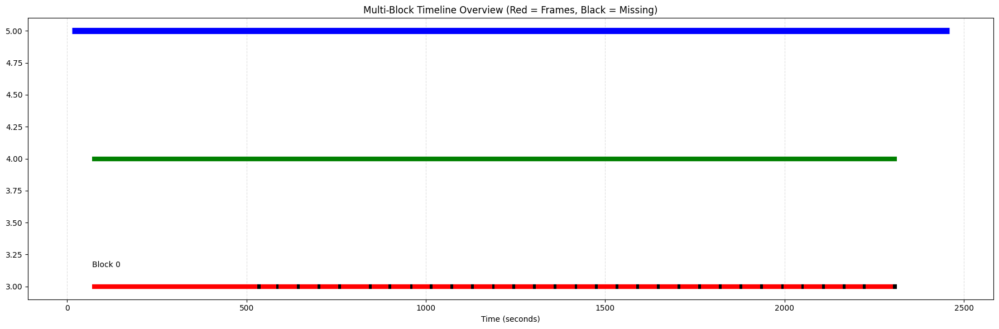


===== MULTI-BLOCK TIMELINE VISUALIZATION COMPLETE =====

Saved timeline figure → G:\Kevin\2026-03-04_08-31-33\Record Node 104\Record Node 104_analysis_2\camera_alignment\timeline_overview_pin1.png


In [36]:
# ============================================================
# ========== CELL H — MULTI-BLOCK TIMELINE VISUALIZATION =====
# ============================================================

import os
import json
import numpy as np
import matplotlib.pyplot as plt
from pathlib import Path

print("\n===== Multi-Block Timeline Visualization =====")

# ------------------------------------------------------------
# USER INPUT: which camera TTL pin to visualize (0 or 1)
# ------------------------------------------------------------
CAMERA_TTL_PIN = 1   ############################################################################################################################################

# ------------------------------------------------------------
# 1. Load full-session TTLs for that camera pin (PORTABLE)
# ------------------------------------------------------------
ttls_dir = analysis_folder / "ttls"
ttl_times_full = np.load(ttls_dir / f"TTL_Pin_{CAMERA_TTL_PIN}.npy")

print(f"Full-session TTL pulses on pin {CAMERA_TTL_PIN}: {len(ttl_times_full)}")

# Load NI timing metadata for start/end (optional)
meta_path = analysis_folder / "metadata" / "ttl_metadata.json"
with open(meta_path, "r") as f:
    ttl_meta = json.load(f)

ni_start = ttl_meta["ni_start_time"]
ni_end   = ttl_meta["ni_end_time"]

# ------------------------------------------------------------
# 2. Collect block timelines
# ------------------------------------------------------------
block_segments = []

for block_index, block in enumerate(session["blocks"]):

    ttl_times_block = np.array(block["ttl_times"])

    aligned_frames_path = Path(block["aligned_frames_path"])
    if not aligned_frames_path.exists():
        raise FileNotFoundError(f"Aligned frames file missing:\n{aligned_frames_path}")

    aligned_frames = np.load(aligned_frames_path, allow_pickle=True)

    print(f"\n--- Block {block_index} ---")
    print(f"TTL pulses: {len(ttl_times_block)}")
    print(f"Aligned frames loaded from: {aligned_frames_path}")

    block_start = ttl_times_block[0]
    block_end   = ttl_times_block[-1]

    print(f"Start: {block_start:.3f} s")
    print(f"End:   {block_end:.3f} s")

    block_segments.append({
        "index": block_index,
        "ttl_times": ttl_times_block,
        "aligned_frames": aligned_frames,
        "start": block_start,
        "end": block_end,
    })

print("\nCollected all block timelines.")

# ------------------------------------------------------------
# 3. Plot everything on one figure
# ------------------------------------------------------------
fig, ax = plt.subplots(figsize=(18, 6))

y_ni = 5
y_ttl_base = 4
y_frames_base = 3

ax.hlines(y_ni, ni_start, ni_end, color='blue', linewidth=8, label="NI-DAQ Recording")

for seg in block_segments:

    b = seg["index"]
    ttl_times_block = seg["ttl_times"]
    aligned_frames = seg["aligned_frames"]

    y_ttl = y_ttl_base - b * 0.6
    y_frames = y_frames_base - b * 0.6

    ax.hlines(y_ttl, seg["start"], seg["end"], color='green', linewidth=6)

    TTL_COUNT = len(ttl_times_block)
    for i, f in enumerate(aligned_frames):
        t0 = ttl_times_block[i]
        if i < TTL_COUNT - 1:
            t1 = ttl_times_block[i+1]
        else:
            t1 = t0 + (ttl_times_block[-1] - ttl_times_block[-2])

        color = 'red' if f is not None else 'black'
        ax.hlines(y_frames, t0, t1, color=color, linewidth=6)

    ax.text(seg["start"], y_frames + 0.15, f"Block {b}", fontsize=10)

ax.set_xlabel("Time (seconds)")
ax.set_title("Multi-Block Timeline Overview (Red = Frames, Black = Missing)")
ax.grid(True, axis='x', linestyle='--', alpha=0.4)

plt.tight_layout()
plt.show()

print("\n===== MULTI-BLOCK TIMELINE VISUALIZATION COMPLETE =====\n")

# ------------------------------------------------------------
# 4. SAVE FIGURE TO ANALYSIS FOLDER (AUTO-INCREMENT)
# ------------------------------------------------------------
timeline_dir = analysis_folder / "camera_alignment"
timeline_dir.mkdir(exist_ok=True)

base_name = f"timeline_overview_pin{CAMERA_TTL_PIN}"
save_path = timeline_dir / f"{base_name}.png"

counter = 1
while save_path.exists():
    save_path = timeline_dir / f"{base_name}_{counter}.png"
    counter += 1

fig.savefig(save_path, dpi=300)
print(f"Saved timeline figure → {save_path}")


===== DLC ↔ TTL ALIGNMENT FOR ALL BLOCKS =====

Processing block 0
TTL entries: 134517
Aligned frames loaded from: G:\Kevin\2026-03-04_08-31-33\Record Node 104\Record Node 104_analysis_3\camera_alignment\aligned_frames_block0.npy
DLC output path: G:\Kevin\2026-03-04_08-31-33\04032026-1_cam2DLC_Resnet50_03042026_Cam2May5shuffle1_snapshot_best-40.h5
Loading DLC output...
DLC rows: 120268
Building DLC row mapping...
Building TTL-aligned DLC timeline...
Aligned DLC length: 134517
Missing DLC entries: 14249
Saved dlc_aligned_block0.npy → G:\Kevin\2026-03-04_08-31-33\Record Node 104\Record Node 104_analysis_3\dlc_alignment\dlc_aligned_block0.npy
Plotting aligned DLC vs frames...


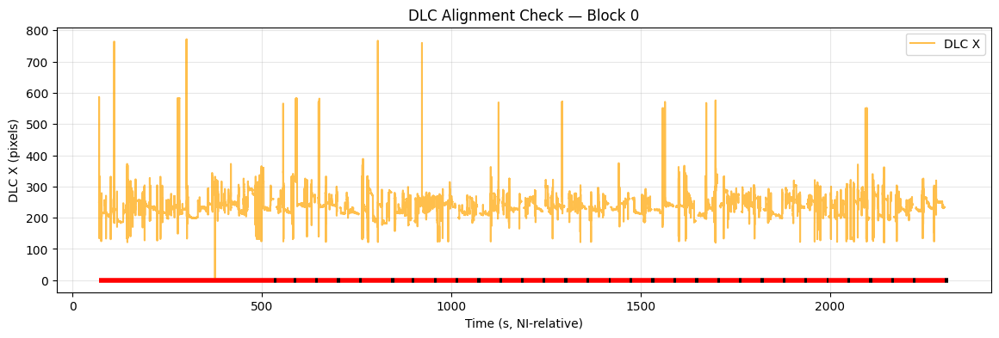


--- Zoom-in diagnostic for missing-frame blocks ---

Missing-frame block 0:
  TTL index range: 27621 → 28114
  Time range: 530.499s → 538.720s
  Number of missing frames: 494


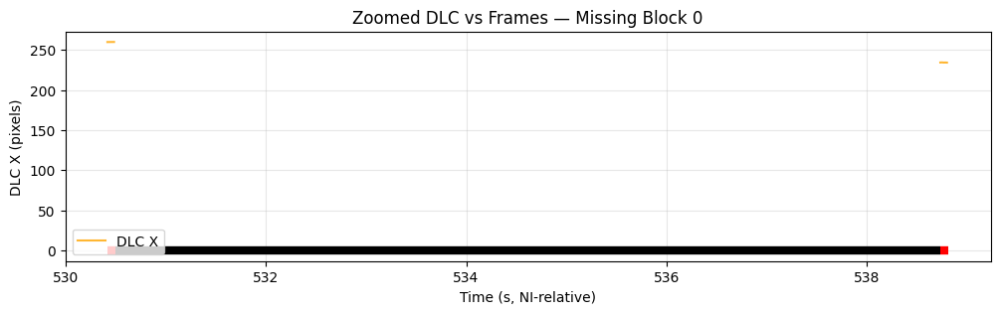


Missing-frame block 1:
  TTL index range: 30788 → 31183
  Time range: 583.309s → 589.895s
  Number of missing frames: 396


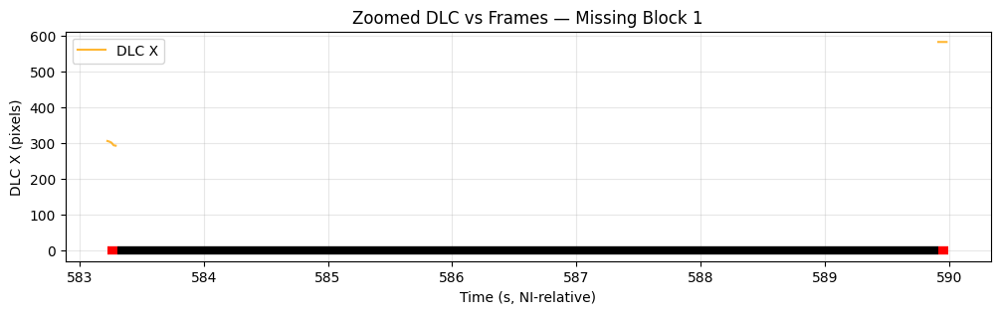


===== ALL BLOCKS DLC ALIGNMENT COMPLETE =====



In [15]:
# ============================================================
# ========== CELL I — DLC ↔ TTL ALIGNMENT FOR ALL BLOCKS =====
# ============================================================

import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from pathlib import Path

print("\n===== DLC ↔ TTL ALIGNMENT FOR ALL BLOCKS =====")

# ------------------------------------------------------------
# SAFETY CHECKS
# ------------------------------------------------------------
required_vars = ["session", "analysis_folder"]
for v in required_vars:
    if v not in globals():
        raise RuntimeError(f"Variable '{v}' is missing. Run previous cells first.")

# ------------------------------------------------------------
# PROCESS EACH BLOCK
# ------------------------------------------------------------
for block_index, block in enumerate(session["blocks"]):

    print(f"\n==============================")
    print(f"Processing block {block_index}")
    print("==============================")

    # 0. Load TTLs and aligned frames (PORTABLE)
    ttl_times_block = np.array(block["ttl_times"])

    aligned_frames_path = Path(block["aligned_frames_path"])
    if not aligned_frames_path.exists():
        raise FileNotFoundError(f"Aligned frames file missing:\n{aligned_frames_path}")

    aligned_frames = np.load(aligned_frames_path, allow_pickle=True)

    DLC_OUTPUT_PATH = block["dlc_path"]

    TTL_COUNT = len(aligned_frames)
    print(f"TTL entries: {TTL_COUNT}")
    print(f"Aligned frames loaded from: {aligned_frames_path}")
    print(f"DLC output path: {DLC_OUTPUT_PATH}")

    # 1. Load DLC output
    print("Loading DLC output...")
    if DLC_OUTPUT_PATH.endswith(".csv"):
        df_dlc = pd.read_csv(DLC_OUTPUT_PATH)
    elif DLC_OUTPUT_PATH.endswith(".h5") or DLC_OUTPUT_PATH.endswith(".hdf5"):
        df_dlc = pd.read_hdf(DLC_OUTPUT_PATH)
    else:
        raise ValueError("DLC output must be .csv or .h5/.hdf5")

    DLC_FRAME_COUNT = len(df_dlc)
    print(f"DLC rows: {DLC_FRAME_COUNT}")

    # --------------------------------------------------------
    # 2. TRUE RAW FRAME INDEX → DLC ROW MAPPING
    # --------------------------------------------------------
    print("Building DLC row mapping...")

    # DLC index is the true raw frame index
    dlc_by_raw_index = {i: df_dlc.iloc[i] for i in range(DLC_FRAME_COUNT)}

    # --------------------------------------------------------
    # 3. Build TTL-aligned DLC timeline
    # --------------------------------------------------------
    print("Building TTL-aligned DLC timeline...")

    dlc_aligned = []
    for f in aligned_frames:
        if f is None:
            dlc_aligned.append(None)
        else:
            raw_idx = int(f.split("_")[1])
            dlc_row = dlc_by_raw_index.get(raw_idx, None)
            dlc_aligned.append(dlc_row)

    dlc_aligned = np.array(dlc_aligned, dtype=object)

    print(f"Aligned DLC length: {len(dlc_aligned)}")
    print(f"Missing DLC entries: {sum(x is None for x in dlc_aligned)}")

    # --------------------------------------------------------
    # 4. Save portable output
    # --------------------------------------------------------
    out_path = Path(block["dlc_aligned_path"])
    np.save(out_path, dlc_aligned)
    print(f"Saved dlc_aligned_block{block_index}.npy → {out_path}")

    # --------------------------------------------------------
    # 5. Quick visualization: frames + DLC
    # --------------------------------------------------------
    print("Plotting aligned DLC vs frames...")

    # Extract X coordinate for first bodypart
    scorer = df_dlc.columns.levels[0][0]
    bodypart = df_dlc.columns.levels[1][0]
    coord = "x"

    x_vals = []
    for row in dlc_aligned:
        if row is None:
            x_vals.append(np.nan)
        else:
            x_vals.append(row[(scorer, bodypart, coord)])

    x_vals = np.array(x_vals)

    plt.figure(figsize=(14, 4))

    # Plot DLC trajectory
    plt.plot(ttl_times_block, x_vals, color='orange', alpha=0.7, label="DLC X")

    # Overlay frame presence (red = present, black = missing)
    for i, f in enumerate(aligned_frames):
        t0 = ttl_times_block[i]
        if i < TTL_COUNT - 1:
            t1 = ttl_times_block[i+1]
        else:
            t1 = t0 + (ttl_times_block[-1] - ttl_times_block[-2])

        color = 'red' if f is not None else 'black'
        plt.hlines(0, t0, t1, color=color, linewidth=4)

    plt.title(f"DLC Alignment Check — Block {block_index}")
    plt.xlabel("Time (s, NI-relative)")
    plt.ylabel("DLC X (pixels)")
    plt.grid(True, alpha=0.3)
    plt.legend()
    plt.show()

    # --------------------------------------------------------
    # 6. Keep memory light
    # --------------------------------------------------------
    block["dlc_aligned"] = None

        # --------------------------------------------------------
    # 7. ZOOM-IN DIAGNOSTIC AROUND MISSING FRAME BLOCKS
    # --------------------------------------------------------
    print("\n--- Zoom-in diagnostic for missing-frame blocks ---")

    # Identify missing-frame indices
    missing_idx = np.where([f is None for f in aligned_frames])[0]

    if len(missing_idx) == 0:
        print("No missing frames detected — nothing to zoom into.")
    else:
        # Group consecutive missing indices into blocks
        blocks = []
        current = [missing_idx[0]]

        for idx in missing_idx[1:]:
            if idx == current[-1] + 1:
                current.append(idx)
            else:
                blocks.append(current)
                current = [idx]
        blocks.append(current)

        # Only zoom into the first two blocks
        blocks_to_plot = blocks[:2]

        for bi, block_idxs in enumerate(blocks_to_plot):
            start_i = block_idxs[0]
            end_i   = block_idxs[-1]

            print(f"\nMissing-frame block {bi}:")
            print(f"  TTL index range: {start_i} → {end_i}")
            print(f"  Time range: {ttl_times_block[start_i]:.3f}s → {ttl_times_block[end_i]:.3f}s")
            print(f"  Number of missing frames: {len(block_idxs)}")

            # Build zoom window (a few frames before/after)
            pad = 5
            zoom_start = max(0, start_i - pad)
            zoom_end   = min(TTL_COUNT - 1, end_i + pad)

            zoom_t = ttl_times_block[zoom_start:zoom_end+1]
            zoom_x = x_vals[zoom_start:zoom_end+1]
            zoom_frames = aligned_frames[zoom_start:zoom_end+1]

            # Plot zoom
            plt.figure(figsize=(12, 3))
            plt.plot(zoom_t, zoom_x, color='orange', alpha=0.8, label="DLC X")

            # Overlay frame spans
            for j in range(zoom_start, zoom_end+1):
                t0 = ttl_times_block[j]
                if j < TTL_COUNT - 1:
                    t1 = ttl_times_block[j+1]
                else:
                    t1 = t0 + (ttl_times_block[-1] - ttl_times_block[-2])

                color = 'red' if aligned_frames[j] is not None else 'black'
                plt.hlines(0, t0, t1, color=color, linewidth=6)

            plt.title(f"Zoomed DLC vs Frames — Missing Block {bi}")
            plt.xlabel("Time (s, NI-relative)")
            plt.ylabel("DLC X (pixels)")
            plt.grid(True, alpha=0.3)
            plt.legend()
            plt.show()


print("\n===== ALL BLOCKS DLC ALIGNMENT COMPLETE =====\n")



===== Full-Session DLC Trajectory on NIDAQ Timeline =====
Using DLC columns for digit1: ('DLC_Resnet50_03042026_Cam2May5shuffle1_snapshot_best-40', 'digit1', 'x'), ('DLC_Resnet50_03042026_Cam2May5shuffle1_snapshot_best-40', 'digit1', 'y'), ('DLC_Resnet50_03042026_Cam2May5shuffle1_snapshot_best-40', 'digit1', 'likelihood')
Using DLC columns for paw: ('DLC_Resnet50_03042026_Cam2May5shuffle1_snapshot_best-40', 'paw', 'x'), ('DLC_Resnet50_03042026_Cam2May5shuffle1_snapshot_best-40', 'paw', 'y'), ('DLC_Resnet50_03042026_Cam2May5shuffle1_snapshot_best-40', 'paw', 'likelihood')
Using DLC columns for nose: ('DLC_Resnet50_03042026_Cam2May5shuffle1_snapshot_best-40', 'nose', 'x'), ('DLC_Resnet50_03042026_Cam2May5shuffle1_snapshot_best-40', 'nose', 'y'), ('DLC_Resnet50_03042026_Cam2May5shuffle1_snapshot_best-40', 'nose', 'likelihood')

--- Block 0 ---
TTL pulses: 134517
DLC-aligned loaded from: G:\Kevin\2026-03-04_08-31-33\Record Node 104\Record Node 104_analysis_3\dlc_alignment\dlc_aligned_bloc

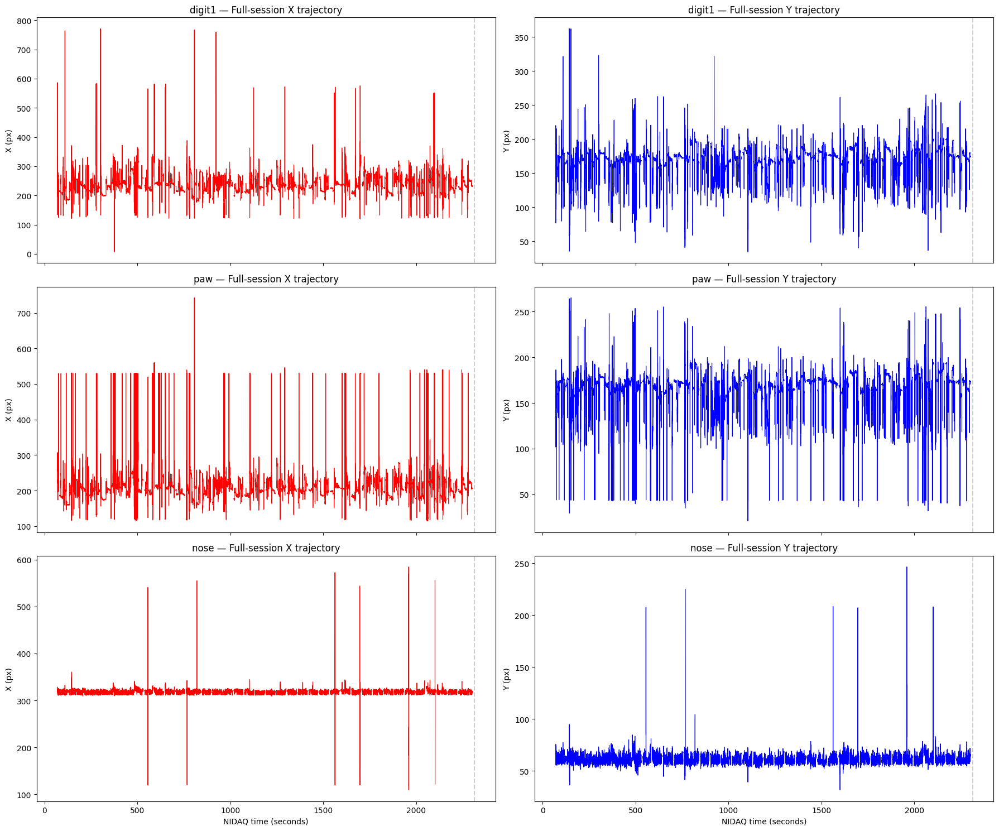


===== FULL-SESSION DLC TRAJECTORY PLOTTING COMPLETE =====

Saved DLC trajectory figure → G:\Kevin\2026-03-04_08-31-33\Record Node 104\Record Node 104_analysis_3\dlc_alignment\full_session_dlc_digit1_paw_nose.png


In [12]:
# ============================================================
# ========== CELL J — FULL-SESSION DLC TRAJECTORY PLOT =======
# ============================================================

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from pathlib import Path

print("\n===== Full-Session DLC Trajectory on NIDAQ Timeline =====")

# ------------------------------------------------------------
# USER INPUT: list of bodyparts to plot
# ------------------------------------------------------------
bodyparts = ["digit1", "paw", "nose"]   ##############################################################################

# ------------------------------------------------------------
# 1. Load DLC column structure from block 0
# ------------------------------------------------------------
df0 = pd.read_hdf(session["blocks"][0]["dlc_path"])

column_map = {}

for bp in bodyparts:
    cols = [c for c in df0.columns if c[1] == bp]
    if len(cols) == 0:
        raise ValueError(f"Bodypart '{bp}' not found in DLC file.")

    x_col = [c for c in cols if c[2] == "x"][0]
    y_col = [c for c in cols if c[2] == "y"][0]
    lik_col = [c for c in cols if c[2] == "likelihood"][0]

    column_map[bp] = (x_col, y_col, lik_col)
    print(f"Using DLC columns for {bp}: {x_col}, {y_col}, {lik_col}")

# ------------------------------------------------------------
# 2. Build full-session arrays (PORTABLE)
# ------------------------------------------------------------
full_times = []
full_data = {bp: {"x": [], "y": []} for bp in bodyparts}
block_boundaries = []

for block_index, block in enumerate(session["blocks"]):

    ttl_times_block = np.array(block["ttl_times"])

    dlc_aligned_path = Path(block["dlc_aligned_path"])
    if not dlc_aligned_path.exists():
        raise FileNotFoundError(f"DLC-aligned file missing:\n{dlc_aligned_path}")

    dlc_aligned = np.load(dlc_aligned_path, allow_pickle=True)

    print(f"\n--- Block {block_index} ---")
    print(f"TTL pulses: {len(ttl_times_block)}")
    print(f"DLC-aligned loaded from: {dlc_aligned_path}")

    for bp in bodyparts:
        x_col, y_col, lik_col = column_map[bp]

        x_vals = []
        y_vals = []

        for row in dlc_aligned:
            if row is None:
                x_vals.append(np.nan)
                y_vals.append(np.nan)
            else:
                x_vals.append(row[x_col])
                y_vals.append(row[y_col])

        full_data[bp]["x"].extend(x_vals)
        full_data[bp]["y"].extend(y_vals)

    full_times.extend(ttl_times_block)
    block_boundaries.append(ttl_times_block[-1])

full_times = np.array(full_times)

for bp in bodyparts:
    full_data[bp]["x"] = np.array(full_data[bp]["x"])
    full_data[bp]["y"] = np.array(full_data[bp]["y"])

print("\nFull-session DLC arrays built successfully.")

# ------------------------------------------------------------
# 3. Plot full-session trajectories (one subplot per bodypart)
# ------------------------------------------------------------
fig, axes = plt.subplots(len(bodyparts), 2, figsize=(18, 5 * len(bodyparts)), sharex=True)

if len(bodyparts) == 1:
    axes = np.array([axes])

for row_idx, bp in enumerate(bodyparts):
    ax_x = axes[row_idx, 0]
    ax_y = axes[row_idx, 1]

    ax_x.plot(full_times, full_data[bp]["x"], color='red', linewidth=0.8)
    ax_x.set_ylabel("X (px)")
    ax_x.set_title(f"{bp} — Full-session X trajectory")

    ax_y.plot(full_times, full_data[bp]["y"], color='blue', linewidth=0.8)
    ax_y.set_ylabel("Y (px)")
    ax_y.set_title(f"{bp} — Full-session Y trajectory")

    for t in block_boundaries:
        ax_x.axvline(t, color='gray', linestyle='--', alpha=0.4)
        ax_y.axvline(t, color='gray', linestyle='--', alpha=0.4)

axes[-1, 0].set_xlabel("NIDAQ time (seconds)")
axes[-1, 1].set_xlabel("NIDAQ time (seconds)")

plt.tight_layout()
plt.show()

print("\n===== FULL-SESSION DLC TRAJECTORY PLOTTING COMPLETE =====\n")

# ------------------------------------------------------------
# 4. SAVE FIGURE TO ANALYSIS FOLDER (AUTO-INCREMENT)
# ------------------------------------------------------------
save_dir = analysis_folder / "dlc_alignment"
save_dir.mkdir(exist_ok=True)

bp_string = "_".join(bodyparts)
base_name = f"full_session_dlc_{bp_string}"
save_path = save_dir / f"{base_name}.png"

counter = 1
while save_path.exists():
    save_path = save_dir / f"{base_name}_{counter}.png"
    counter += 1

fig.savefig(save_path, dpi=300)
print(f"Saved DLC trajectory figure → {save_path}")


===== Building Full-Session RAW DLC + Physiology Figure =====
Loaded 71 behavioral TTLs from pin 4
Using DLC columns: X=('DLC_Resnet50_03042026_Cam2May5shuffle1_snapshot_best-40', 'digit1', 'x'), Y=('DLC_Resnet50_03042026_Cam2May5shuffle1_snapshot_best-40', 'digit1', 'y')

--- Block 0 ---
TTL pulses: 134517
DLC-aligned loaded from: G:\Kevin\2026-03-04_08-31-33\Record Node 104\Record Node 104_analysis_2\dlc_alignment\dlc_aligned_block0.npy

Full-session DLC arrays built successfully.
Loaded firing-rate QC from analysis folder.


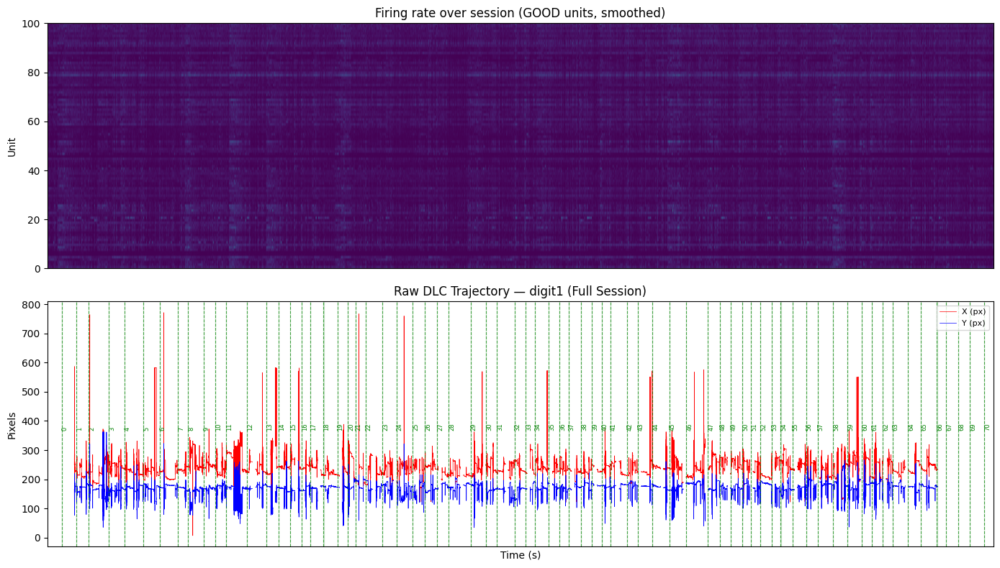


===== RAW DLC + PHYSIOLOGY FIGURE COMPLETE =====

Saved figure → G:\Kevin\2026-03-04_08-31-33\Record Node 104\Record Node 104_analysis_2\dlc_alignment\raw_dlc_physio_digit1_pin4.png


In [39]:
# ============================================================
# ========== CELL K — RAW DLC + FIRING HEATMAP (PORTABLE) =====
# ============================================================

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from pathlib import Path
import json

print("\n===== Building Full-Session RAW DLC + Physiology Figure =====")

# ------------------------------------------------------------
# USER PARAMETERS
# ------------------------------------------------------------
bodypart = "digit1"      ################################################################################################################
BEHAVIOR_PIN = 4         ################################################################################################################ 
DRAW_LABELS = True       ################################################################################################################
SHADE_AFTER_TTL = True   ################################################################################################################
SHADE_WINDOW = 0.15       # seconds
BEHAVIOR_HEIGHT = 2.0    ################################################################################################################
HEATMAP_HEIGHT = 6.0     ################################################################################################################

# ------------------------------------------------------------
# 0. LOAD BEHAVIORAL TTLs (PORTABLE)
# ------------------------------------------------------------
ttl_path = analysis_folder / "ttls" / f"TTL_Pin_{BEHAVIOR_PIN}.npy"
if not ttl_path.exists():
    raise FileNotFoundError(f"Behavior TTL file missing:\n{ttl_path}")

behavior_ttls = np.load(ttl_path)
print(f"Loaded {len(behavior_ttls)} behavioral TTLs from pin {BEHAVIOR_PIN}")

# ------------------------------------------------------------
# 1. Load DLC column structure from block 0
# ------------------------------------------------------------
df0 = pd.read_hdf(session["blocks"][0]["dlc_path"])

cols = [c for c in df0.columns if c[1] == bodypart]
if len(cols) == 0:
    raise ValueError(f"Bodypart '{bodypart}' not found in DLC file.")

x_col = [c for c in cols if c[2] == "x"][0]
y_col = [c for c in cols if c[2] == "y"][0]

print(f"Using DLC columns: X={x_col}, Y={y_col}")

# ------------------------------------------------------------
# 2. Build full-session DLC trajectories (PORTABLE)
# ------------------------------------------------------------
full_times = []
full_x = []
full_y = []
block_boundaries = []

for block_index, block in enumerate(session["blocks"]):

    ttl_times_block = np.array(block["ttl_times"])

    dlc_aligned_path = Path(block["dlc_aligned_path"])
    if not dlc_aligned_path.exists():
        raise FileNotFoundError(
            f"DLC-aligned file missing for block {block_index}:\n{dlc_aligned_path}\n"
            "Run CELL D (DLC alignment) first."
        )

    dlc_aligned = np.load(dlc_aligned_path, allow_pickle=True)

    print(f"\n--- Block {block_index} ---")
    print(f"TTL pulses: {len(ttl_times_block)}")
    print(f"DLC-aligned loaded from: {dlc_aligned_path}")

    x_vals = []
    y_vals = []

    for row in dlc_aligned:
        if row is None:
            x_vals.append(np.nan)
            y_vals.append(np.nan)
        else:
            x_vals.append(row[x_col])
            y_vals.append(row[y_col])

    full_times.extend(ttl_times_block)
    full_x.extend(x_vals)
    full_y.extend(y_vals)

    block_boundaries.append(ttl_times_block[-1])

full_times = np.array(full_times)
full_x = np.array(full_x, dtype=float)
full_y = np.array(full_y, dtype=float)

print("\nFull-session DLC arrays built successfully.")

# ------------------------------------------------------------
# 3. LOAD FIRING-RATE QC (PORTABLE)
# ------------------------------------------------------------
qc_dir = analysis_folder / "qc"

rate_matrix = np.load(qc_dir / "rate_matrix.npy")
good_units = np.load(qc_dir / "good_units.npy")

with open(qc_dir / "recording_duration.json", "r") as f:
    recording_duration = json.load(f)["recording_duration"]

print("Loaded firing-rate QC from analysis folder.")

# ------------------------------------------------------------
# 4. Build combined figure
# ------------------------------------------------------------
fig = plt.figure(figsize=(14, HEATMAP_HEIGHT + BEHAVIOR_HEIGHT))

# ---- Top: firing rate heatmap ----
ax1 = fig.add_subplot(2, 1, 1)

ax1.imshow(
    rate_matrix,
    aspect='auto',
    extent=[0, recording_duration, 0, len(good_units)],
    origin='lower'
)

ax1.set_title("Firing rate over session (GOOD units, smoothed)")
ax1.set_ylabel("Unit")
ax1.set_xticks([])

# ---- Bottom: raw DLC trace ----
ax2 = fig.add_subplot(2, 1, 2, sharex=ax1)

ax2.plot(full_times, full_x, color='red', linewidth=0.5, label="X (px)")
ax2.plot(full_times, full_y, color='blue', linewidth=0.5, label="Y (px)")

# ------------------------------------------------------------
# 5. Add behavioral TTL markers
# ------------------------------------------------------------
for i, t in enumerate(behavior_ttls):

    ax2.axvline(t, color='green', linestyle='--', linewidth=0.8, alpha=0.7)

    if DRAW_LABELS:
        ax2.text(
            t,
            np.nanmax(full_y) + 5,
            f"{i}",
            rotation=90,
            fontsize=6,
            color='green',
            verticalalignment='bottom'
        )

    if SHADE_AFTER_TTL:
        ax2.axvspan(t, t + SHADE_WINDOW, color='green', alpha=0.15)

# ------------------------------------------------------------
# 6. Final formatting
# ------------------------------------------------------------
ax2.set_ylabel("Pixels")
ax2.set_xlabel("Time (s)")
ax2.set_title(f"Raw DLC Trajectory — {bodypart} (Full Session)")
ax2.legend(loc="upper right", fontsize=8)

plt.tight_layout()
plt.show()

print("\n===== RAW DLC + PHYSIOLOGY FIGURE COMPLETE =====\n")

# ------------------------------------------------------------
# 7. SAVE FIGURE TO ANALYSIS FOLDER (AUTO-INCREMENT)
# ------------------------------------------------------------
save_dir = analysis_folder / "dlc_alignment"
save_dir.mkdir(exist_ok=True)

base_name = f"raw_dlc_physio_{bodypart}_pin{BEHAVIOR_PIN}"
save_path = save_dir / f"{base_name}.png"

counter = 1
while save_path.exists():
    save_path = save_dir / f"{base_name}_{counter}.png"
    counter += 1

fig.savefig(save_path, dpi=300)
print(f"Saved figure → {save_path}")

In [26]:
# ============================================================
# ========== COMPUTE NPX → NI-DAQ OFFSET (PIN 0 vs PIN 5) =====
# ============================================================

import numpy as np
from pathlib import Path

print("\n===== ALIGNING NPX CLOCK TO NI-DAQ CLOCK =====")

# ------------------------------------------------------------
# 1. Load NI-DAQ sync pulses (pin 5)
# ------------------------------------------------------------
ni_sync = np.load(analysis_folder / "ttls" / "TTL_Pin_5.npy")
print(f"NI sync pulses (pin 5): {len(ni_sync)}")

# ------------------------------------------------------------
# 2. Load NPX sync pulses (pin 0)
# ------------------------------------------------------------
npx_ttl_folder = Path (r"G:\Kevin\2026-03-04_08-31-33\Record Node 101\experiment1\recording1\events\Neuropix-PXI-100.ProbeA\TTL"  ###################################################################################################################
)

npx_ts = np.load(npx_ttl_folder / "timestamps.npy")
npx_words = np.load(npx_ttl_folder / "full_words.npy")

def rising_edges(words, ts, pin):
    mask = 1 << pin
    bit = (words & mask) > 0
    prev = np.roll(bit, 1)
    prev[0] = False
    rising = (~prev) & bit
    return ts[rising]

npx_sync = rising_edges(npx_words, npx_ts, pin=0)
print(f"NPX sync pulses (pin 0): {len(npx_sync)}")

# ------------------------------------------------------------
# 3. Compute offset between clocks
# ------------------------------------------------------------
min_len = min(len(ni_sync), len(npx_sync))
offsets = ni_sync[:min_len] - npx_sync[:min_len]
offset = np.median(offsets)

print(f"\nEstimated NPX → NI-DAQ offset: {offset:.6f} seconds")


===== ALIGNING NPX CLOCK TO NI-DAQ CLOCK =====
NI sync pulses (pin 5): 2447
NPX sync pulses (pin 0): 2448

Estimated NPX → NI-DAQ offset: 1.160825 seconds



===== Peri-TTL Behavior + Physiology Zoom (RAW TIME) =====
Found 71 behavioral TTLs on pin 4
TTL at 37.552s not inside any block — skipping.


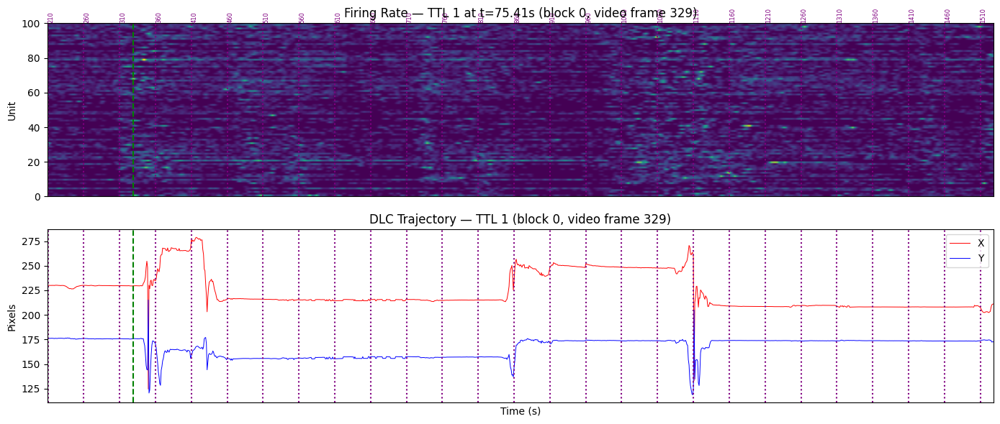

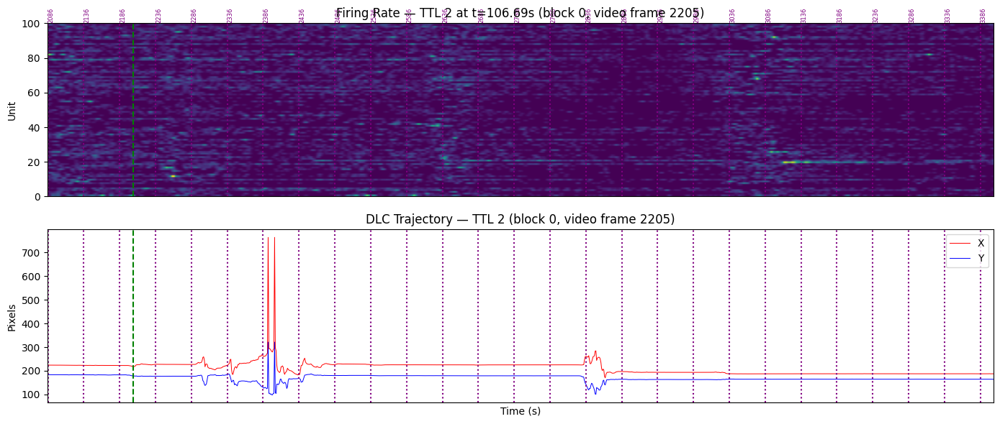

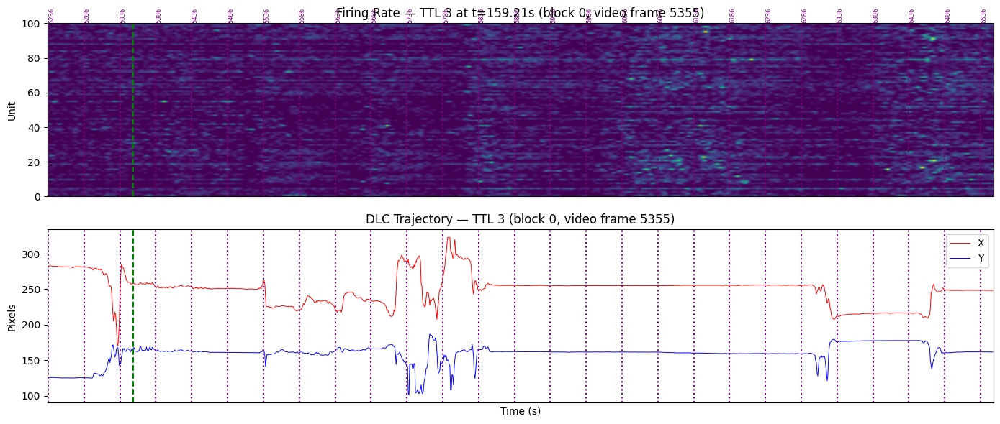

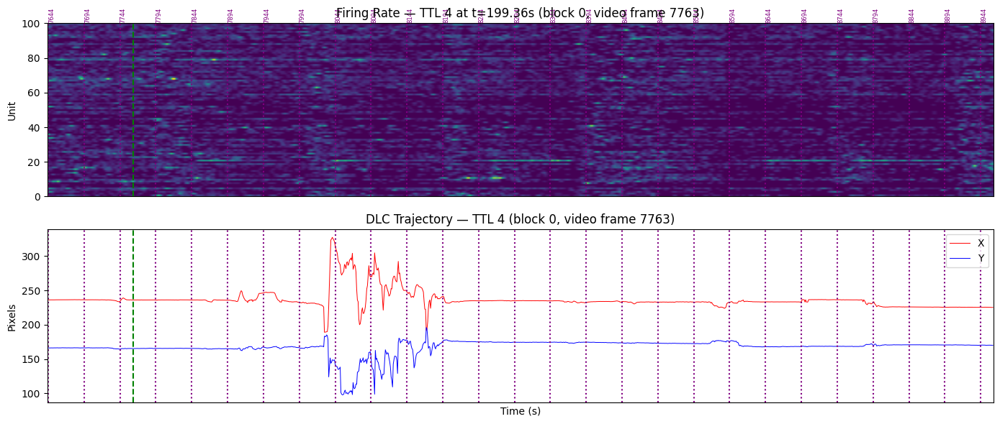

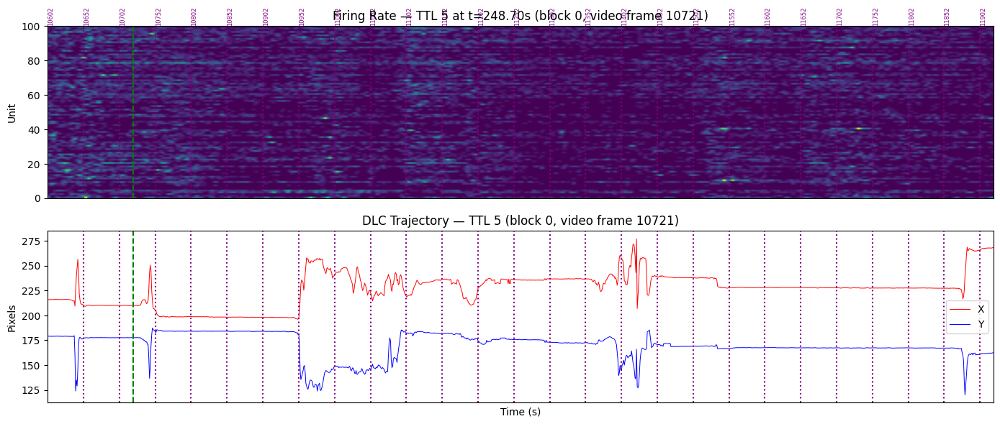

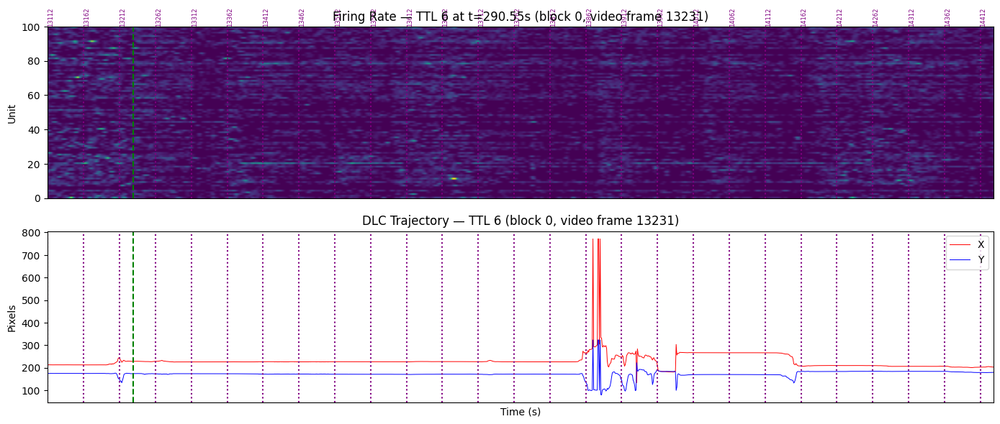

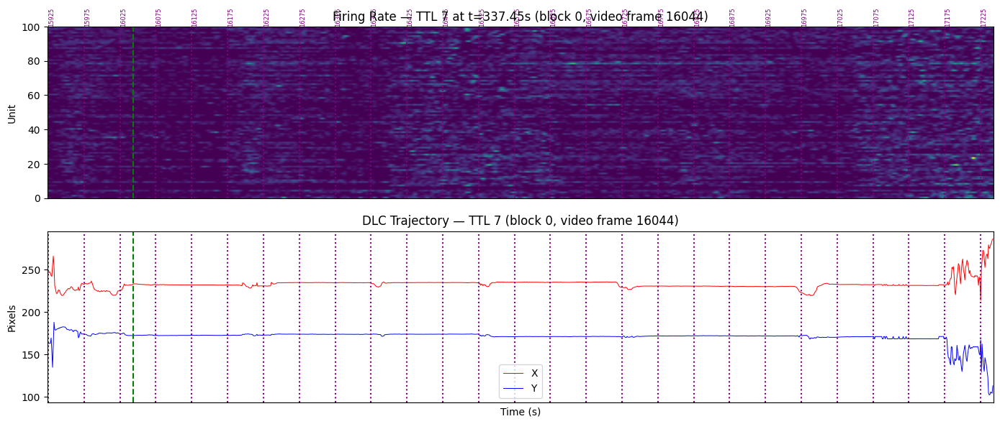

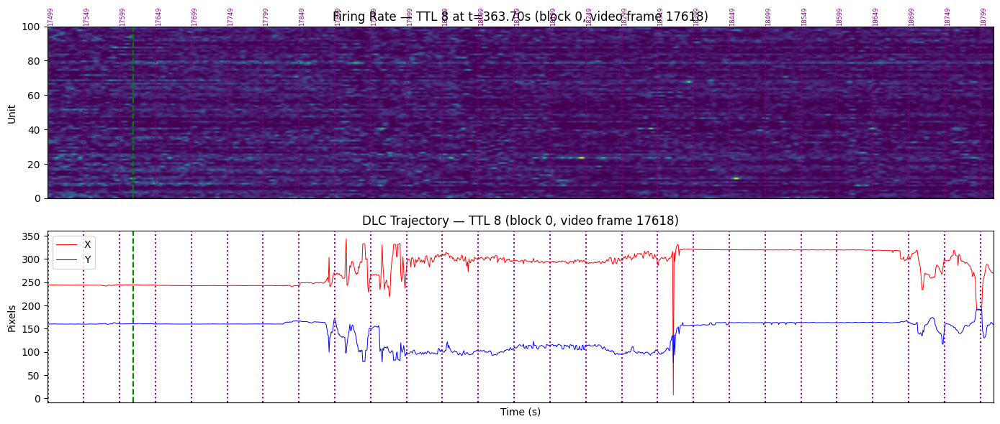

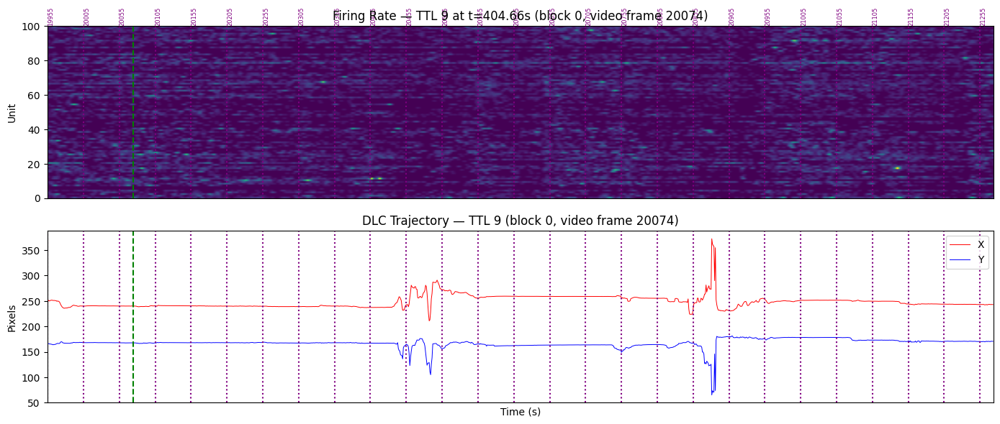


===== Peri-TTL Zoom Complete =====



In [40]:
# ============================================================
# ========== PERI-TTL ZOOM (RAW FIRING TIME AXIS) ============
# ============================================================

import numpy as np
import matplotlib.pyplot as plt
import json
from pathlib import Path

print("\n===== Peri-TTL Behavior + Physiology Zoom (RAW TIME) =====")

# ------------------------------------------------------------
# PARAMETERS
# ------------------------------------------------------------
BEHAV_PIN = 4
WIN_PRE = 2.0
WIN_POST = 20.0
MAX_TTLS = 10
bodypart = "digit1"

# ------------------------------------------------------------
# Helper: extract rising edges
# ------------------------------------------------------------
def extract_rising_edges(full_words, timestamps, pin):
    mask = 1 << pin
    bit_on = (full_words & mask) > 0
    bit_prev = np.roll(bit_on, 1)
    bit_prev[0] = False
    rising = (~bit_prev) & bit_on
    return timestamps[rising]

# ------------------------------------------------------------
# Helper: extract integer frame number from filename
# ------------------------------------------------------------
def extract_frame_number(fname):
    base = Path(fname).stem
    parts = base.split("_")
    return int(parts[1])

# ------------------------------------------------------------
# Load block metadata
# ------------------------------------------------------------
with open(analysis_folder / "metadata" / "block_info.json", "r") as f:
    block_info = json.load(f)

# Load aligned frames + TTLs for each block
aligned_blocks = []
ttl_blocks = []

for b in range(len(block_info)):
    aligned_blocks.append(
        np.load(analysis_folder / "camera_alignment" / f"aligned_frames_block{b}.npy", allow_pickle=True)
    )
    ttl_blocks.append(
        np.load(analysis_folder / "camera_alignment" / f"ttl_times_block{b}.npy")
    )

# ------------------------------------------------------------
# Load firing QC (RAW TIME AXIS)
# ------------------------------------------------------------
qc_dir = analysis_folder / "qc"

rate_matrix = np.load(qc_dir / "rate_matrix.npy")
good_units = np.load(qc_dir / "good_units.npy")
centers = np.load(qc_dir / "centers.npy")   # RAW TIME AXIS

# ------------------------------------------------------------
# Extract behavioral TTLs (NI-DAQ time)
# ------------------------------------------------------------
beh_ttles = extract_rising_edges(full_words_ni, timestamps_ni, BEHAV_PIN)
print(f"Found {len(beh_ttles)} behavioral TTLs on pin {BEHAV_PIN}")

if MAX_TTLS is not None:
    beh_ttles = beh_ttles[:MAX_TTLS]

# ------------------------------------------------------------
# Loop through behavioral TTLs
# ------------------------------------------------------------
for idx, t_event in enumerate(beh_ttles):

    # --------------------------------------------------------
    # Determine which block this TTL belongs to
    # --------------------------------------------------------
    block_id = None
    ttl_idx_in_block = None

    for b, info in enumerate(block_info):
        start = info["start_time_sec"]
        end   = info["end_time_sec"]
        if start <= t_event <= end:
            block_id = b
            ttl_idx_in_block = np.argmin(np.abs(ttl_blocks[b] - t_event))
            break

    if block_id is None:
        print(f"TTL at {t_event:.3f}s not inside any block — skipping.")
        continue

    # --------------------------------------------------------
    # Get aligned frame filename for this TTL
    # --------------------------------------------------------
    aligned_frames = aligned_blocks[block_id]
    fname = aligned_frames[ttl_idx_in_block]

    if fname is None:
        print(f"TTL {idx}: missing aligned frame — skipping.")
        continue

    # Extract integer frame index
    video_frame = extract_frame_number(fname)

    # --------------------------------------------------------
    # Build 50-frame tick marks across the entire window
    # --------------------------------------------------------
    # Estimate frame rate from TTL spacing inside this block
    frame_intervals = np.diff(ttl_blocks[block_id])
    est_fps = 1 / np.median(frame_intervals)

    # Convert window to frame units
    frames_before = int(WIN_PRE * est_fps)
    frames_after  = int(WIN_POST * est_fps)

    # Build ticks every 50 frames
    tick_frames = np.arange(video_frame - frames_before,
                            video_frame + frames_after + 1,
                            50)
    tick_frames = tick_frames[tick_frames >= 0]

    # Convert tick frames → timestamps
    tick_times = []
    for vf in tick_frames:
        matches = [
            i for i, f in enumerate(aligned_frames)
            if f is not None and extract_frame_number(f) == vf
        ]
        if len(matches) > 0:
            tick_times.append(ttl_blocks[block_id][matches[0]])

    tick_times = np.array(tick_times)

    # --------------------------------------------------------
    # Build peri-event window
    # --------------------------------------------------------
    t0 = t_event - WIN_PRE
    t1 = t_event + WIN_POST

    mask_dlc = (full_times >= t0) & (full_times <= t1)
    mask_fr  = (centers >= t0) & (centers <= t1)

    # --------------------------------------------------------
    # Plot
    # --------------------------------------------------------
    fig = plt.figure(figsize=(14, 6))

    # ---- Firing rate ----
    ax1 = fig.add_subplot(2, 1, 1)

    ax1.imshow(
        rate_matrix[:, mask_fr],
        aspect='auto',
        extent=[t0, t1, 0, len(good_units)],
        origin='lower'
    )

    ax1.axvline(t_event, color='green', linestyle='--')

    for tf, vf in zip(tick_times, tick_frames):
        ax1.axvline(tf, color='purple', linestyle=':')
        ax1.text(tf, len(good_units) + 1, f"{vf}", rotation=90, fontsize=6, color='purple')

    ax1.set_title(
        f"Firing Rate — TTL {idx} at t={t_event:.2f}s "
        f"(block {block_id}, video frame {video_frame})"
    )
    ax1.set_ylabel("Unit")
    ax1.set_xticks([])

    # ---- DLC ----
    ax2 = fig.add_subplot(2, 1, 2, sharex=ax1)

    ax2.plot(full_times[mask_dlc], full_x[mask_dlc], 'r', linewidth=0.7, label="X")
    ax2.plot(full_times[mask_dlc], full_y[mask_dlc], 'b', linewidth=0.7, label="Y")

    ax2.axvline(t_event, color='green', linestyle='--')

    for tf in tick_times:
        ax2.axvline(tf, color='purple', linestyle=':')

    ax2.set_ylabel("Pixels")
    ax2.set_xlabel("Time (s)")
    ax2.set_title(
        f"DLC Trajectory — TTL {idx} "
        f"(block {block_id}, video frame {video_frame})"
    )
    ax2.legend()

    plt.tight_layout()
    plt.show()

print("\n===== Peri-TTL Zoom Complete =====\n")

In [1]:
# ============================================================
# ========== PETH AROUND REACHES (BLOCK-AWARE) ===============
# ============================================================

import numpy as np
import matplotlib.pyplot as plt
import json
from pathlib import Path

print("\n===== PETH Around Reaches (X deflection) =====")

# ------------------------------------------------------------
# PARAMETERS
# ------------------------------------------------------------
BEHAV_PIN      = 4       # behavioral TTL pin
TTL_WIN_PRE    = 0.0     # only look after TTL
TTL_WIN_POST   = 15.0    # seconds after TTL to search for reaches
REACH_THRESH   = 24.0    # +ΔX threshold (pixels)
REFRACTORY     = 5.1     # seconds between counted reaches
PETH_WIN       = 5     # ± window around reach (seconds)
MAX_TTLS       = None    # or e.g. 50 to limit

# ------------------------------------------------------------
# Helpers
# ------------------------------------------------------------
def extract_rising_edges(full_words, timestamps, pin):
    mask = 1 << pin
    bit_on = (full_words & mask) > 0
    bit_prev = np.roll(bit_on, 1)
    bit_prev[0] = False
    rising = (~bit_prev) & bit_on
    return timestamps[rising]

def extract_frame_number(fname):
    base = Path(fname).stem
    parts = base.split("_")
    return int(parts[1])

# ------------------------------------------------------------
# Load block metadata + alignment (from disk)
# ------------------------------------------------------------
with open(analysis_folder / "metadata" / "block_info.json", "r") as f:
    block_info = json.load(f)

aligned_blocks = []
ttl_blocks = []

for b in range(len(block_info)):
    aligned_blocks.append(
        np.load(analysis_folder / "camera_alignment" / f"aligned_frames_block{b}.npy",
                allow_pickle=True)
    )
    ttl_blocks.append(
        np.load(analysis_folder / "camera_alignment" / f"ttl_times_block{b}.npy")
    )

# ------------------------------------------------------------
# Load firing QC (RAW TIME AXIS)
# ------------------------------------------------------------
qc_dir = analysis_folder / "qc"

rate_matrix = np.load(qc_dir / "rate_matrix.npy")
good_units  = np.load(qc_dir / "good_units.npy")
centers     = np.load(qc_dir / "centers.npy") +12.81  # RAW TIME AXIS

bin_width = np.median(np.diff(centers))
peri_bins = np.arange(-PETH_WIN, PETH_WIN + bin_width, bin_width)

# ------------------------------------------------------------
# Extract behavioral TTLs (NI-DAQ time)
# ------------------------------------------------------------
beh_ttles = extract_rising_edges(full_words_ni, timestamps_ni, BEHAV_PIN)
print(f"Found {len(beh_ttles)} behavioral TTLs on pin {BEHAV_PIN}")

if MAX_TTLS is not None:
    beh_ttles = beh_ttles[:MAX_TTLS]

# ------------------------------------------------------------
# 1. Detect reach times after each behavioral TTL
# ------------------------------------------------------------
reach_candidates = []   # list of dicts with reach_time, ttl_time, etc.

for t_event in beh_ttles:
    t0 = t_event + TTL_WIN_PRE
    t1 = t_event + TTL_WIN_POST

    # DLC segment after TTL
    mask_dlc = (full_times >= t0) & (full_times <= t1)
    if not np.any(mask_dlc):
        continue

    t_seg = full_times[mask_dlc]
    x_seg = full_x[mask_dlc]

    # baseline = X at TTL (first sample in segment)
    baseline = x_seg[0]
    dx = x_seg - baseline

    # indices where ΔX exceeds threshold
    idx_cross = np.where(dx >= REACH_THRESH)[0]
    if len(idx_cross) == 0:
        continue

    # first crossing is first reach candidate for this TTL
    first_idx = idx_cross[0]
    reach_time = t_seg[first_idx]

    # store candidate; block/frame info will be added later
    reach_candidates.append({
        "reach_time": reach_time,
        "ttl_time": t_event
    })

print(f"Initial reach candidates: {len(reach_candidates)}")

# ------------------------------------------------------------
# 2. Enforce global refractory (1.1 s) across all reaches
# ------------------------------------------------------------
reach_candidates.sort(key=lambda d: d["reach_time"])

kept_reaches = []
last_time = -np.inf

for rc in reach_candidates:
    rt = rc["reach_time"]
    if rt - last_time >= REFRACTORY:
        kept_reaches.append(rc)
        last_time = rt

print(f"Reaches after refractory ({REFRACTORY}s): {len(kept_reaches)}")

# ------------------------------------------------------------
# 3. Annotate each reach with block + frame info
# ------------------------------------------------------------
for rc in kept_reaches:
    rt = rc["reach_time"]

    # find block
    block_id = None
    for b, info in enumerate(block_info):
        start = info["start_time_sec"]
        end   = info["end_time_sec"]
        if start <= rt <= end:
            block_id = b
            break

    rc["block_id"] = block_id

    if block_id is None:
        rc["frame_time"] = None
        rc["frame_idx"]  = None
        continue

    aligned_frames = aligned_blocks[block_id]
    ttl_times_block = ttl_blocks[block_id]

    # nearest camera TTL to reach time
    cam_idx = int(np.argmin(np.abs(ttl_times_block - rt)))
    fname = aligned_frames[cam_idx]

    if fname is None:
        rc["frame_time"] = ttl_times_block[cam_idx]
        rc["frame_idx"]  = None
    else:
        rc["frame_time"] = ttl_times_block[cam_idx]
        rc["frame_idx"]  = extract_frame_number(fname)

# Print a quick summary
print("\nExample reaches (up to 10):")
for rc in kept_reaches[:10]:
    print(
        f"Reach @ {rc['reach_time']:.3f}s "
        f"(TTL {rc['ttl_time']:.3f}s, block {rc['block_id']}, "
        f"frame_time {rc['frame_time']}, frame_idx {rc['frame_idx']})"
    )

# ------------------------------------------------------------
# 4. Build PETH around reaches (±1 s) using rate_matrix
# ------------------------------------------------------------
peth = np.zeros((len(good_units), len(peri_bins)), dtype=float)

for rc in kept_reaches:
    rt = rc["reach_time"]
    rel_centers = centers - rt

    # for each peri bin, grab nearest center
    idxs = np.array([
        np.argmin(np.abs(rel_centers - tb)) for tb in peri_bins
    ])

    peth += rate_matrix[:, idxs]

if len(kept_reaches) > 0:
    peth /= len(kept_reaches)

# ------------------------------------------------------------
# 5. Plot PETH
# ------------------------------------------------------------
fig, axes = plt.subplots(2, 1, figsize=(10, 8), sharex=True)

# Heatmap
axes[0].imshow(
    peth,
    aspect='auto',
    extent=[peri_bins[0], peri_bins[-1], 0, len(good_units)],
    origin='lower'
)
axes[0].axvline(0, color='white', linestyle='--', linewidth=1)
axes[0].set_ylabel("Unit")
axes[0].set_title(
    f"PETH around reaches (ΔX ≥ {REACH_THRESH}, "
    f"refractory {REFRACTORY}s, n_reaches={len(kept_reaches)})"
)

# Population average
mean_peth = peth.mean(axis=0) if len(kept_reaches) > 0 else np.zeros_like(peri_bins)
axes[1].plot(peri_bins, mean_peth, color='k')
axes[1].axvline(0, color='red', linestyle='--', linewidth=1, label="Reach onset")
axes[1].set_xlabel("Time from reach (s)")
axes[1].set_ylabel("Mean firing rate")
axes[1].legend()

plt.tight_layout()
plt.show()

print("\n===== PETH Around Reaches Complete =====\n")


===== PETH Around Reaches (X deflection) =====


NameError: name 'analysis_folder' is not defined


===== Histogram of Reach Latencies Relative to Behavioral TTLs =====
Computed 49 reach latencies


C:\Users\kkost\AppData\Local\Temp\ipykernel_19608\1216719140.py:45: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_yticklabels([f"{abs(int(y))}" for y in yticks])


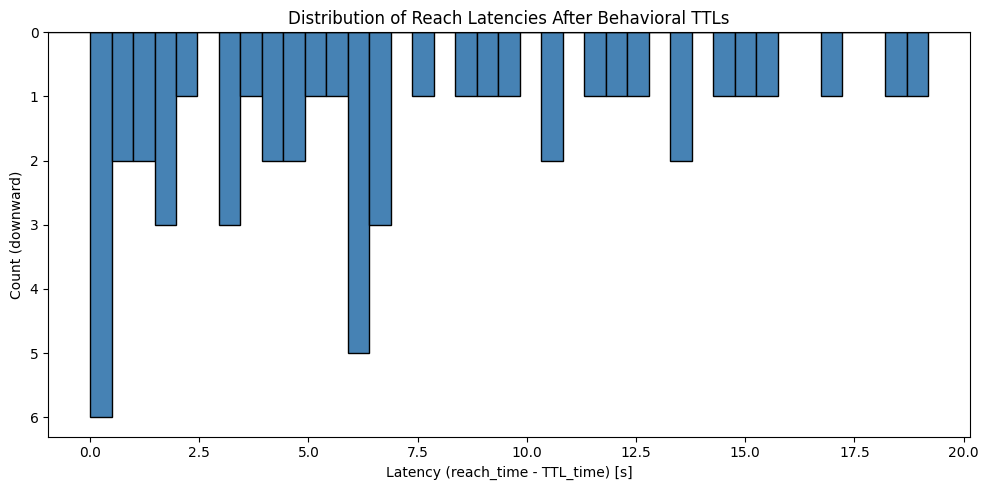


===== Histogram Complete =====



In [47]:
# ============================================================
# ========== HISTOGRAM OF (REACH - TTL) LATENCIES ============
# ============================================================

import numpy as np
import matplotlib.pyplot as plt

print("\n===== Histogram of Reach Latencies Relative to Behavioral TTLs =====")

# Extract latencies
latencies = np.array([
    rc["reach_time"] - rc["ttl_time"]
    for rc in kept_reaches
    if rc["reach_time"] is not None and rc["ttl_time"] is not None
])

print(f"Computed {len(latencies)} reach latencies")

# Plot downward-facing histogram
fig, ax = plt.subplots(figsize=(10, 5))

bins = np.linspace(0, np.max(latencies), 40)

# Normal histogram
counts, edges = np.histogram(latencies, bins=bins)

# Plot downward bars
ax.bar(
    edges[:-1],
    -counts,                 # negative height → downward
    width=np.diff(edges),
    align='edge',
    color='steelblue',
    edgecolor='black'
)

ax.axhline(0, color='black', linewidth=1)

ax.set_xlabel("Latency (reach_time - TTL_time) [s]")
ax.set_ylabel("Count (downward)")
ax.set_title("Distribution of Reach Latencies After Behavioral TTLs")

# Pretty y-axis: show positive numbers even though bars go downward
yticks = ax.get_yticks()
ax.set_yticklabels([f"{abs(int(y))}" for y in yticks])

plt.tight_layout()
plt.show()

print("\n===== Histogram Complete =====\n")


===== PETH Around Reaches (X deflection, shifted physiology) =====
Found 71 behavioral TTLs on pin 4
Initial reach candidates: 49
Reaches after refractory (1s): 49

Example reaches (up to 10):
Reach @ 76.042s (TTL 75.410s, block 0, frame_time 76.042375, frame_idx 367)
Reach @ 108.308s (TTL 106.690s, block 0, frame_time 108.307975, frame_idx 2302)
Reach @ 165.369s (TTL 159.209s, block 0, frame_time 165.369025, frame_idx 5724)
Reach @ 203.938s (TTL 199.361s, block 0, frame_time 203.937875, frame_idx 8037)
Reach @ 249.077s (TTL 248.699s, block 0, frame_time 249.07665, frame_idx 10744)
Reach @ 301.002s (TTL 290.549s, block 0, frame_time 301.0022, frame_idx 13858)
Reach @ 356.730s (TTL 337.446s, block 0, frame_time 356.729675, frame_idx 17200)
Reach @ 368.252s (TTL 363.700s, block 0, frame_time 368.252025, frame_idx 17891)
Reach @ 411.107s (TTL 404.661s, block 0, frame_time 411.10655, frame_idx 20461)
Reach @ 438.237s (TTL 434.474s, block 0, frame_time 438.23665, frame_idx 22088)

Top 10 m

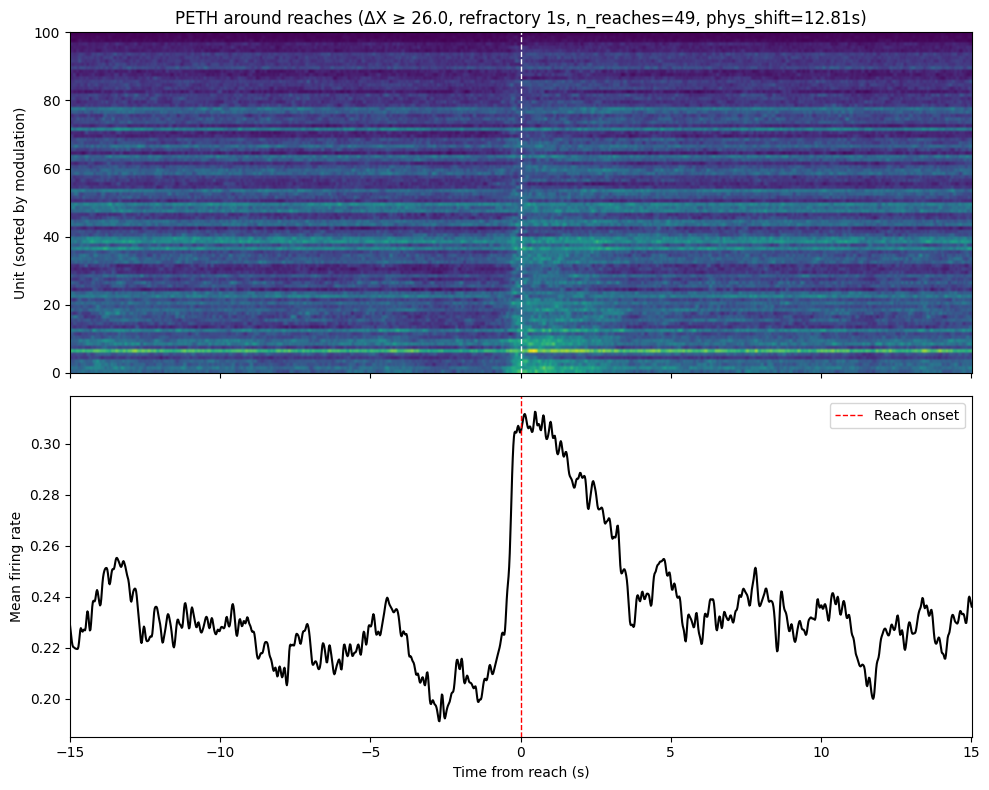


===== PETH Around Reaches Complete =====



In [48]:
# ============================================================
# ========== PETH AROUND REACHES (BLOCK-AWARE) ===============
# ============================================================

import numpy as np
import matplotlib.pyplot as plt
import json
from pathlib import Path

print("\n===== PETH Around Reaches (X deflection, shifted physiology) =====")

# ------------------------------------------------------------
# PARAMETERS
# ------------------------------------------------------------
BEHAV_PIN      = 4       # behavioral TTL pin
TTL_WIN_PRE    = 0.0
TTL_WIN_POST   = 20.0
REACH_THRESH   = 26.0
REFRACTORY     = 1
PETH_WIN       = 15
MAX_TTLS       = None

PHYS_SHIFT     = 12.81   # <-- shift physiology LATER than reach

# ------------------------------------------------------------
# Helpers
# ------------------------------------------------------------
def extract_rising_edges(full_words, timestamps, pin):
    mask = 1 << pin
    bit_on = (full_words & mask) > 0
    bit_prev = np.roll(bit_on, 1)
    bit_prev[0] = False
    rising = (~bit_prev) & bit_on
    return timestamps[rising]

def extract_frame_number(fname):
    base = Path(fname).stem
    parts = base.split("_")
    return int(parts[1])

# ------------------------------------------------------------
# Load block metadata + alignment
# ------------------------------------------------------------
with open(analysis_folder / "metadata" / "block_info.json", "r") as f:
    block_info = json.load(f)

aligned_blocks = []
ttl_blocks = []

for b in range(len(block_info)):
    aligned_blocks.append(
        np.load(analysis_folder / "camera_alignment" / f"aligned_frames_block{b}.npy",
                allow_pickle=True)
    )
    ttl_blocks.append(
        np.load(analysis_folder / "camera_alignment" / f"ttl_times_block{b}.npy")
    )

# ------------------------------------------------------------
# Load firing QC (RAW TIME AXIS)
# ------------------------------------------------------------
qc_dir = analysis_folder / "qc"

rate_matrix = np.load(qc_dir / "rate_matrix.npy")
good_units  = np.load(qc_dir / "good_units.npy")
centers     = np.load(qc_dir / "centers.npy")

# Apply physiology shift
centers_shifted = centers + PHYS_SHIFT

bin_width = np.median(np.diff(centers))
peri_bins = np.arange(-PETH_WIN, PETH_WIN + bin_width, bin_width)

# ------------------------------------------------------------
# Extract behavioral TTLs
# ------------------------------------------------------------
beh_ttles = extract_rising_edges(full_words_ni, timestamps_ni, BEHAV_PIN)
print(f"Found {len(beh_ttles)} behavioral TTLs on pin {BEHAV_PIN}")

if MAX_TTLS is not None:
    beh_ttles = beh_ttles[:MAX_TTLS]

# ------------------------------------------------------------
# 1. Detect reach times after each TTL
# ------------------------------------------------------------
reach_candidates = []

for t_event in beh_ttles:
    t0 = t_event + TTL_WIN_PRE
    t1 = t_event + TTL_WIN_POST

    mask_dlc = (full_times >= t0) & (full_times <= t1)
    if not np.any(mask_dlc):
        continue

    t_seg = full_times[mask_dlc]
    x_seg = full_x[mask_dlc]

    baseline = x_seg[0]
    dx = x_seg - baseline

    idx_cross = np.where(dx >= REACH_THRESH)[0]
    if len(idx_cross) == 0:
        continue

    first_idx = idx_cross[0]
    reach_time = t_seg[first_idx]

    reach_candidates.append({
        "reach_time": reach_time,
        "ttl_time": t_event
    })

print(f"Initial reach candidates: {len(reach_candidates)}")

# ------------------------------------------------------------
# 2. Refractory
# ------------------------------------------------------------
reach_candidates.sort(key=lambda d: d["reach_time"])

kept_reaches = []
last_time = -np.inf

for rc in reach_candidates:
    rt = rc["reach_time"]
    if rt - last_time >= REFRACTORY:
        kept_reaches.append(rc)
        last_time = rt

print(f"Reaches after refractory ({REFRACTORY}s): {len(kept_reaches)}")

# ------------------------------------------------------------
# 3. Annotate block + frame
# ------------------------------------------------------------
for rc in kept_reaches:
    rt = rc["reach_time"]

    block_id = None
    for b, info in enumerate(block_info):
        if info["start_time_sec"] <= rt <= info["end_time_sec"]:
            block_id = b
            break

    rc["block_id"] = block_id

    if block_id is None:
        rc["frame_time"] = None
        rc["frame_idx"]  = None
        continue

    aligned_frames = aligned_blocks[block_id]
    ttl_times_block = ttl_blocks[block_id]

    cam_idx = int(np.argmin(np.abs(ttl_times_block - rt)))
    fname = aligned_frames[cam_idx]

    rc["frame_time"] = ttl_times_block[cam_idx]
    rc["frame_idx"]  = extract_frame_number(fname) if fname is not None else None

print("\nExample reaches (up to 10):")
for rc in kept_reaches[:10]:
    print(
        f"Reach @ {rc['reach_time']:.3f}s "
        f"(TTL {rc['ttl_time']:.3f}s, block {rc['block_id']}, "
        f"frame_time {rc['frame_time']}, frame_idx {rc['frame_idx']})"
    )

# ------------------------------------------------------------
# 4. Build PETH (using shifted physiology)
# ------------------------------------------------------------
peth = np.zeros((len(good_units), len(peri_bins)), dtype=float)

for rc in kept_reaches:
    rt = rc["reach_time"]
    rel_centers = centers_shifted - rt

    idxs = np.array([
        np.argmin(np.abs(rel_centers - tb)) for tb in peri_bins
    ])

    peth += rate_matrix[:, idxs]

if len(kept_reaches) > 0:
    peth /= len(kept_reaches)

# ------------------------------------------------------------
# 4b. Compute modulation + sort units
# ------------------------------------------------------------
modulation = peth.max(axis=1) - peth.min(axis=1)
sorted_idx = np.argsort(modulation)[::-1]  # descending

peth_sorted = peth[sorted_idx]
good_units_sorted = good_units[sorted_idx]

print("\nTop 10 most modulated units:")
for i in range(min(10, len(good_units_sorted))):
    print(f"Unit {good_units_sorted[i]} — modulation = {modulation[sorted_idx[i]]:.3f}")

# ------------------------------------------------------------
# 5. Plot PETH (sorted)
# ------------------------------------------------------------
fig, axes = plt.subplots(2, 1, figsize=(10, 8), sharex=True)

axes[0].imshow(
    peth_sorted,
    aspect='auto',
    extent=[peri_bins[0], peri_bins[-1], 0, len(good_units)],
    origin='lower'
)
axes[0].axvline(0, color='white', linestyle='--', linewidth=1)
axes[0].set_ylabel("Unit (sorted by modulation)")
axes[0].set_title(
    f"PETH around reaches (ΔX ≥ {REACH_THRESH}, refractory {REFRACTORY}s, "
    f"n_reaches={len(kept_reaches)}, phys_shift={PHYS_SHIFT}s)"
)

mean_peth = peth_sorted.mean(axis=0)
axes[1].plot(peri_bins, mean_peth, color='k')
axes[1].axvline(0, color='red', linestyle='--', linewidth=1, label="Reach onset")
axes[1].set_xlabel("Time from reach (s)")
axes[1].set_ylabel("Mean firing rate")
axes[1].legend()

plt.tight_layout()
plt.show()

print("\n===== PETH Around Reaches Complete =====\n")


===== TTL-centered PETH with Reach Latency Histogram =====
Computed 49 reach latencies

Top 10 most modulated units (TTL-centered):
Unit 157 — modulation = 0.274
Unit 197 — modulation = 0.268
Unit 351 — modulation = 0.265
Unit 53 — modulation = 0.259
Unit 250 — modulation = 0.248
Unit 95 — modulation = 0.246
Unit 350 — modulation = 0.244
Unit 136 — modulation = 0.235
Unit 367 — modulation = 0.234
Unit 65 — modulation = 0.229


C:\Users\kkost\AppData\Local\Temp\ipykernel_19608\898408312.py:113: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax2.set_yticklabels([f"{abs(int(y))}" for y in yticks])


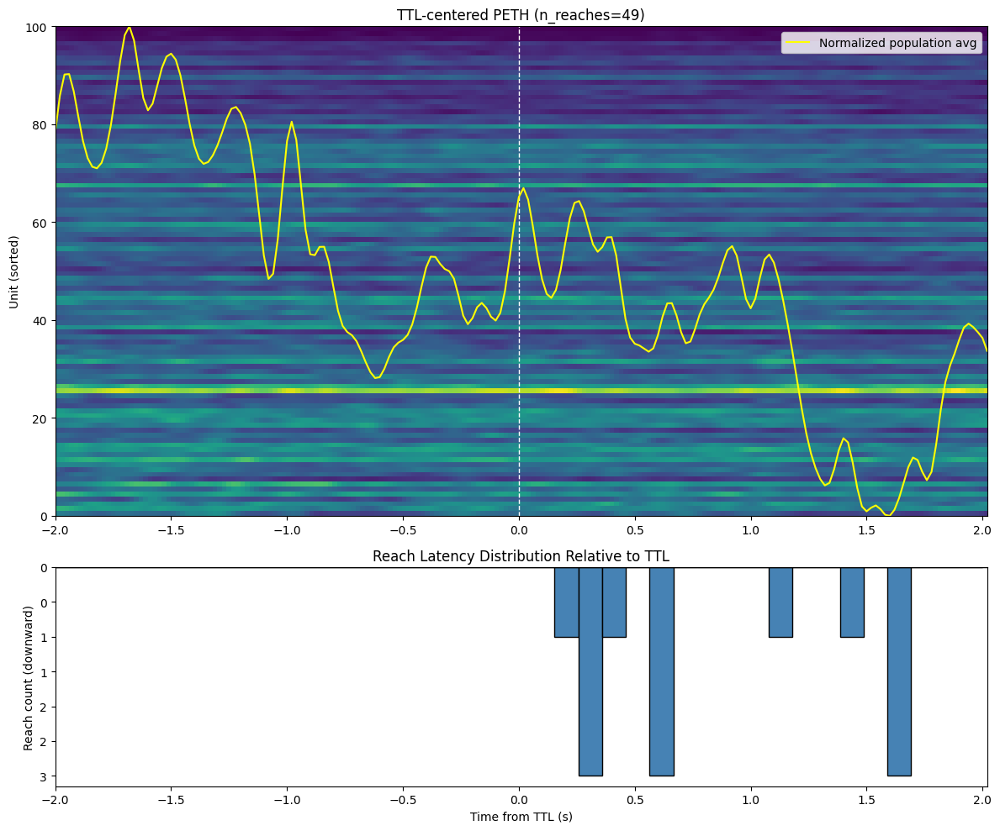


===== TTL-centered PETH Complete =====



In [49]:
# ============================================================
# ========== TTL-CENTERED PETH + REACH LATENCY HISTO =========
# ============================================================

import numpy as np
import matplotlib.pyplot as plt

print("\n===== TTL-centered PETH with Reach Latency Histogram =====")

# ------------------------------------------------------------
# PARAMETERS
# ------------------------------------------------------------
PETH_WIN = 2     # ± window around TTL
SORT_UNITS = True   # sort units by modulation strength

# ------------------------------------------------------------
# 1. Compute reach latencies relative to TTL
# ------------------------------------------------------------
latencies = np.array([
    rc["reach_time"] - rc["ttl_time"]
    for rc in kept_reaches
    if rc["reach_time"] is not None and rc["ttl_time"] is not None
])

print(f"Computed {len(latencies)} reach latencies")

# ------------------------------------------------------------
# 2. Build TTL-centered PETH
# ------------------------------------------------------------
bin_width = np.median(np.diff(centers))
peri_bins = np.arange(-PETH_WIN, PETH_WIN + bin_width, bin_width)

peth = np.zeros((len(good_units), len(peri_bins)))

for rc in kept_reaches:
    t_ttl = rc["ttl_time"]
    rel_centers = centers - t_ttl

    idxs = np.array([
        np.argmin(np.abs(rel_centers - tb)) for tb in peri_bins
    ])

    peth += rate_matrix[:, idxs]

if len(kept_reaches) > 0:
    peth /= len(kept_reaches)

# ------------------------------------------------------------
# 3. Sort units by modulation (optional)
# ------------------------------------------------------------
if SORT_UNITS:
    modulation = peth.max(axis=1) - peth.min(axis=1)
    sorted_idx = np.argsort(modulation)[::-1]
    peth_sorted = peth[sorted_idx]
    good_units_sorted = good_units[sorted_idx]

    print("\nTop 10 most modulated units (TTL-centered):")
    for i in range(min(10, len(good_units_sorted))):
        print(f"Unit {good_units_sorted[i]} — modulation = {modulation[sorted_idx[i]]:.3f}")
else:
    peth_sorted = peth
    good_units_sorted = good_units

# ------------------------------------------------------------
# 4. Plot TTL-centered PETH + downward reach histogram
# ------------------------------------------------------------
fig = plt.figure(figsize=(12, 10))

# ---- PETH heatmap ----
ax1 = fig.add_subplot(3, 1, (1, 2))

ax1.imshow(
    peth_sorted,
    aspect='auto',
    extent=[peri_bins[0], peri_bins[-1], 0, len(good_units_sorted)],
    origin='lower'
)
ax1.axvline(0, color='white', linestyle='--', linewidth=1)
ax1.set_ylabel("Unit (sorted)" if SORT_UNITS else "Unit")
ax1.set_title(
    f"TTL-centered PETH (n_reaches={len(kept_reaches)})"
)

# ---- Population average ----
mean_peth = peth_sorted.mean(axis=0)
ax1.plot(peri_bins, 
         (mean_peth - mean_peth.min()) / (mean_peth.max() - mean_peth.min()) * len(good_units_sorted),
         color='yellow', linewidth=1.5, label="Normalized population avg")
ax1.legend(loc="upper right")

# ---- Downward histogram of reach latencies ----
ax2 = fig.add_subplot(3, 1, 3, sharex=ax1)

bins = np.linspace(-PETH_WIN, PETH_WIN, 40)
counts, edges = np.histogram(latencies, bins=bins)

ax2.bar(
    edges[:-1],
    -counts,                      # downward
    width=np.diff(edges),
    align='edge',
    color='steelblue',
    edgecolor='black'
)

ax2.axhline(0, color='black', linewidth=1)
ax2.set_xlabel("Time from TTL (s)")
ax2.set_ylabel("Reach count (downward)")
ax2.set_title("Reach Latency Distribution Relative to TTL")

# Pretty y-axis: show positive numbers
yticks = ax2.get_yticks()
ax2.set_yticklabels([f"{abs(int(y))}" for y in yticks])

plt.tight_layout()
plt.show()

print("\n===== TTL-centered PETH Complete =====\n")


===== TTL-centered PETH with Reach Latency Histogram =====
Computed 49 reach latencies
Mean latency = 6.630s, std = 5.294s

Top 10 most modulated units (TTL-centered):
Unit 384 — modulation = 0.577
Unit 250 — modulation = 0.573
Unit 223 — modulation = 0.552
Unit 270 — modulation = 0.439
Unit 386 — modulation = 0.434
Unit 150 — modulation = 0.415
Unit 94 — modulation = 0.411
Unit 103 — modulation = 0.390
Unit 328 — modulation = 0.378
Unit 0 — modulation = 0.374


C:\Users\kkost\AppData\Local\Temp\ipykernel_19608\857659593.py:119: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax2.set_yticklabels([f"{abs(int(y))}" for y in yticks])


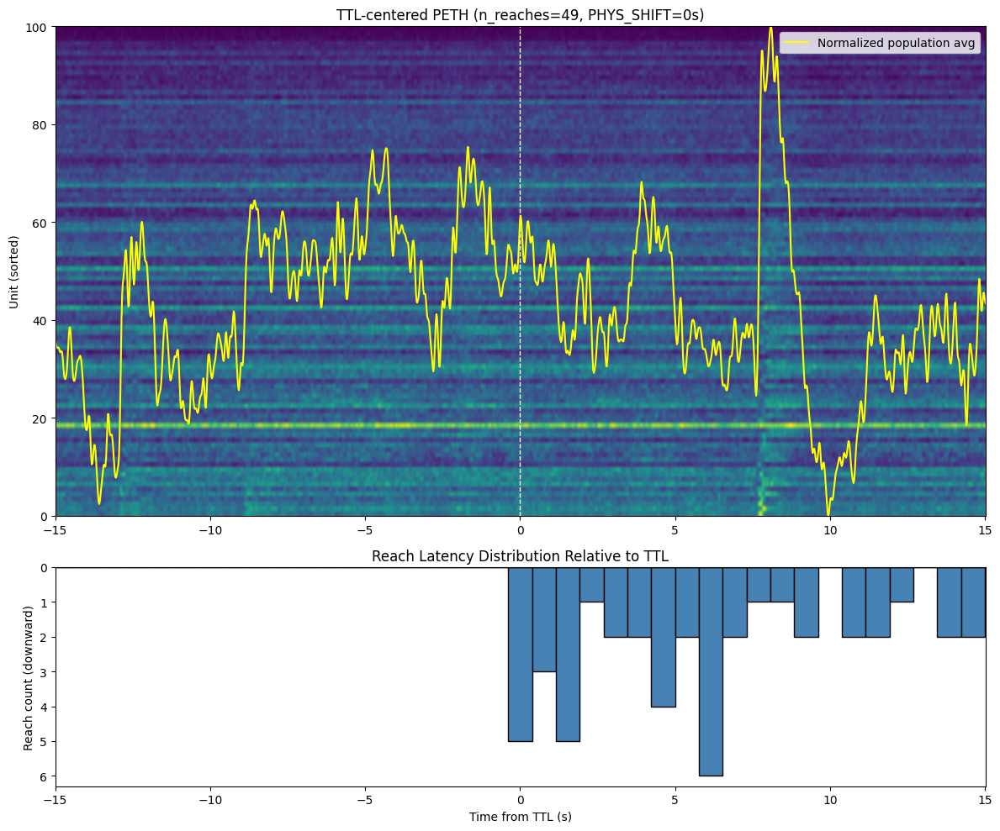


===== TTL-centered PETH Complete =====



In [52]:
# ============================================================
# ========== TTL-CENTERED PETH + REACH LATENCY HISTO WITH PHYS SHIFT =========
# ============================================================

import numpy as np
import matplotlib.pyplot as plt

print("\n===== TTL-centered PETH with Reach Latency Histogram =====")

# ------------------------------------------------------------
# PARAMETERS
# ------------------------------------------------------------
PETH_WIN = 15.0        # ± window around TTL
SORT_UNITS = True     # sort units by modulation strength
PHYS_SHIFT = 0     # <-- shift physiology relative to TTL (e.g., +5.208)

# ------------------------------------------------------------
# 1. Compute reach latencies relative to TTL
# ------------------------------------------------------------
latencies = np.array([
    rc["reach_time"] - rc["ttl_time"]
    for rc in kept_reaches
    if rc["reach_time"] is not None and rc["ttl_time"] is not None
])

print(f"Computed {len(latencies)} reach latencies")
print(f"Mean latency = {latencies.mean():.3f}s, std = {latencies.std():.3f}s")

# ------------------------------------------------------------
# 2. Build TTL-centered PETH (with physiology shift)
# ------------------------------------------------------------
bin_width = np.median(np.diff(centers))
peri_bins = np.arange(-PETH_WIN, PETH_WIN + bin_width, bin_width)

peth = np.zeros((len(good_units), len(peri_bins)))

for rc in kept_reaches:
    t_ttl = rc["ttl_time"]

    # Apply physiology shift here
    rel_centers = (centers + PHYS_SHIFT) - t_ttl

    idxs = np.array([
        np.argmin(np.abs(rel_centers - tb)) for tb in peri_bins
    ])

    peth += rate_matrix[:, idxs]

if len(kept_reaches) > 0:
    peth /= len(kept_reaches)

# ------------------------------------------------------------
# 3. Sort units by modulation (optional)
# ------------------------------------------------------------
if SORT_UNITS:
    modulation = peth.max(axis=1) - peth.min(axis=1)
    sorted_idx = np.argsort(modulation)[::-1]
    peth_sorted = peth[sorted_idx]
    good_units_sorted = good_units[sorted_idx]

    print("\nTop 10 most modulated units (TTL-centered):")
    for i in range(min(10, len(good_units_sorted))):
        print(f"Unit {good_units_sorted[i]} — modulation = {modulation[sorted_idx[i]]:.3f}")
else:
    peth_sorted = peth
    good_units_sorted = good_units

# ------------------------------------------------------------
# 4. Plot TTL-centered PETH + downward reach histogram
# ------------------------------------------------------------
fig = plt.figure(figsize=(12, 10))

# ---- PETH heatmap ----
ax1 = fig.add_subplot(3, 1, (1, 2))

ax1.imshow(
    peth_sorted,
    aspect='auto',
    extent=[peri_bins[0], peri_bins[-1], 0, len(good_units_sorted)],
    origin='lower'
)
ax1.axvline(0, color='white', linestyle='--', linewidth=1)
ax1.set_ylabel("Unit (sorted)" if SORT_UNITS else "Unit")
ax1.set_title(
    f"TTL-centered PETH (n_reaches={len(kept_reaches)}, PHYS_SHIFT={PHYS_SHIFT}s)"
)

# ---- Population average ----
mean_peth = peth_sorted.mean(axis=0)
ax1.plot(
    peri_bins,
    (mean_peth - mean_peth.min()) / (mean_peth.max() - mean_peth.min()) * len(good_units_sorted),
    color='yellow', linewidth=1.5, label="Normalized population avg"
)
ax1.legend(loc="upper right")

# ---- Downward histogram of reach latencies ----
ax2 = fig.add_subplot(3, 1, 3, sharex=ax1)

bins = np.linspace(-PETH_WIN, PETH_WIN, 40)
counts, edges = np.histogram(latencies, bins=bins)

ax2.bar(
    edges[:-1],
    -counts,                      # downward
    width=np.diff(edges),
    align='edge',
    color='steelblue',
    edgecolor='black'
)

ax2.axhline(0, color='black', linewidth=1)
ax2.set_xlabel("Time from TTL (s)")
ax2.set_ylabel("Reach count (downward)")
ax2.set_title("Reach Latency Distribution Relative to TTL")

# Pretty y-axis: show positive numbers
yticks = ax2.get_yticks()
ax2.set_yticklabels([f"{abs(int(y))}" for y in yticks])

plt.tight_layout()
plt.show()

print("\n===== TTL-centered PETH Complete =====\n")


===== Reach–TTL Latency + Random Control PETH =====
n latencies = 49
mean latency = 6.630s, std = 5.294s


C:\Users\kkost\AppData\Local\Temp\ipykernel_19608\3249735946.py:70: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  axes[2].set_yticklabels([f"{abs(int(y))}" for y in yt])


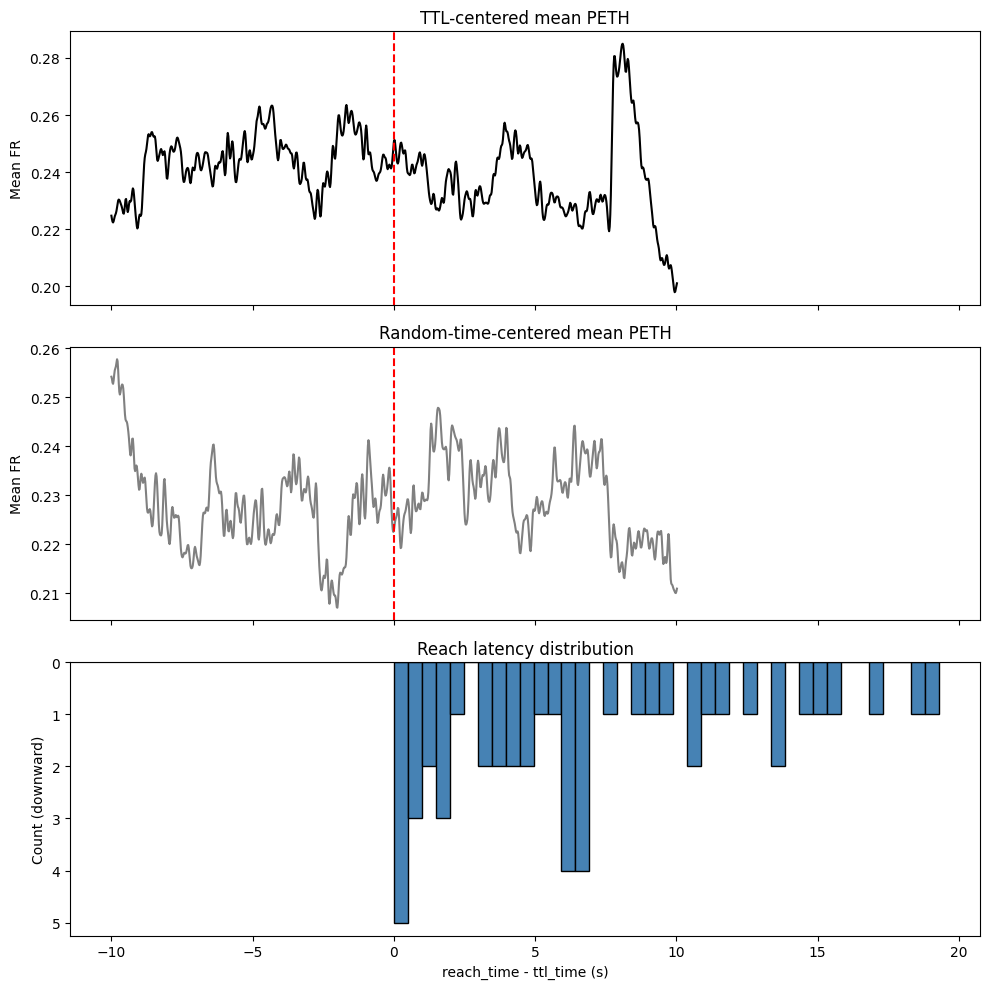


===== Latency + Random Control Complete =====



In [50]:
# ============================================================
# ========== LATENCY HISTO + RANDOM CONTROL PETH =============
# ============================================================

import numpy as np
import matplotlib.pyplot as plt

print("\n===== Reach–TTL Latency + Random Control PETH =====")

# latencies
latencies = np.array([
    rc["reach_time"] - rc["ttl_time"]
    for rc in kept_reaches
    if rc["reach_time"] is not None and rc["ttl_time"] is not None
])

print(f"n latencies = {len(latencies)}")
print(f"mean latency = {latencies.mean():.3f}s, std = {latencies.std():.3f}s")

# TTL-centered PETH (real)
PETH_WIN = 10.0
bin_width = np.median(np.diff(centers))
peri_bins = np.arange(-PETH_WIN, PETH_WIN + bin_width, bin_width)

peth_ttl = np.zeros((len(good_units), len(peri_bins)))
for rc in kept_reaches:
    t_ttl = rc["ttl_time"]
    rel_centers = centers - t_ttl
    idxs = np.array([np.argmin(np.abs(rel_centers - tb)) for tb in peri_bins])
    peth_ttl += rate_matrix[:, idxs]
if len(kept_reaches) > 0:
    peth_ttl /= len(kept_reaches)

# random control: same number of events, random times in recording span
t_min, t_max = centers.min(), centers.max()
rand_times = np.random.uniform(t_min + PETH_WIN, t_max - PETH_WIN, size=len(kept_reaches))

peth_rand = np.zeros_like(peth_ttl)
for t_r in rand_times:
    rel_centers = centers - t_r
    idxs = np.array([np.argmin(np.abs(rel_centers - tb)) for tb in peri_bins])
    peth_rand += rate_matrix[:, idxs]
peth_rand /= len(rand_times)

fig, axes = plt.subplots(3, 1, figsize=(10, 10), sharex=True)

# TTL-centered mean
axes[0].plot(peri_bins, peth_ttl.mean(axis=0), color='k')
axes[0].axvline(0, color='red', linestyle='--')
axes[0].set_ylabel("Mean FR")
axes[0].set_title("TTL-centered mean PETH")

# random-centered mean
axes[1].plot(peri_bins, peth_rand.mean(axis=0), color='gray')
axes[1].axvline(0, color='red', linestyle='--')
axes[1].set_ylabel("Mean FR")
axes[1].set_title("Random-time-centered mean PETH")

# latency histogram
bins = np.linspace(0, np.max(latencies), 40)
counts, edges = np.histogram(latencies, bins=bins)
axes[2].bar(edges[:-1], -counts, width=np.diff(edges), align='edge',
            color='steelblue', edgecolor='black')
axes[2].axhline(0, color='black')
axes[2].set_xlabel("reach_time - ttl_time (s)")
axes[2].set_ylabel("Count (downward)")
axes[2].set_title("Reach latency distribution")

yt = axes[2].get_yticks()
axes[2].set_yticklabels([f"{abs(int(y))}" for y in yt])

plt.tight_layout()
plt.show()

print("\n===== Latency + Random Control Complete =====\n")


===== Single-unit reach-centered trials =====


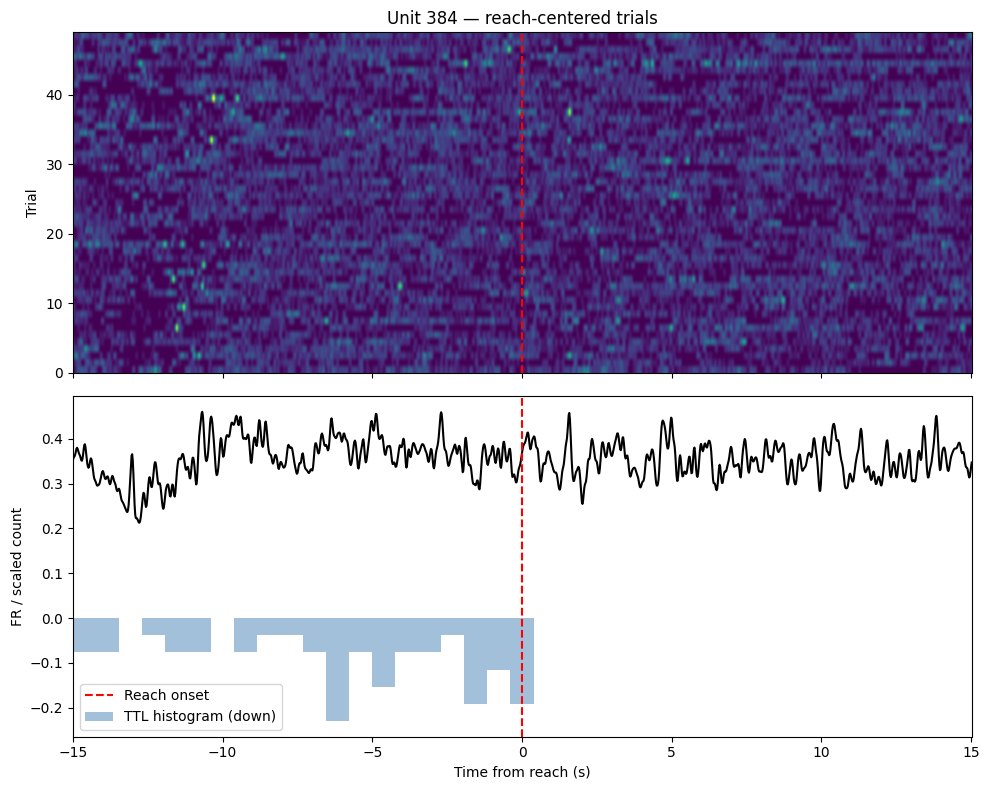

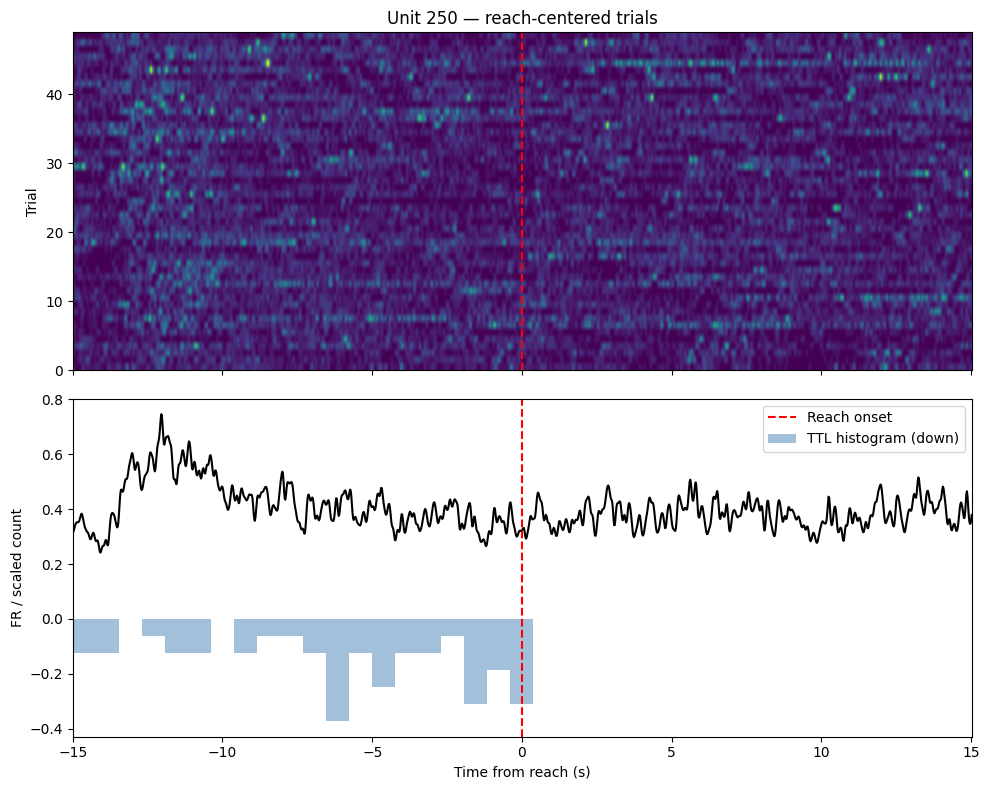

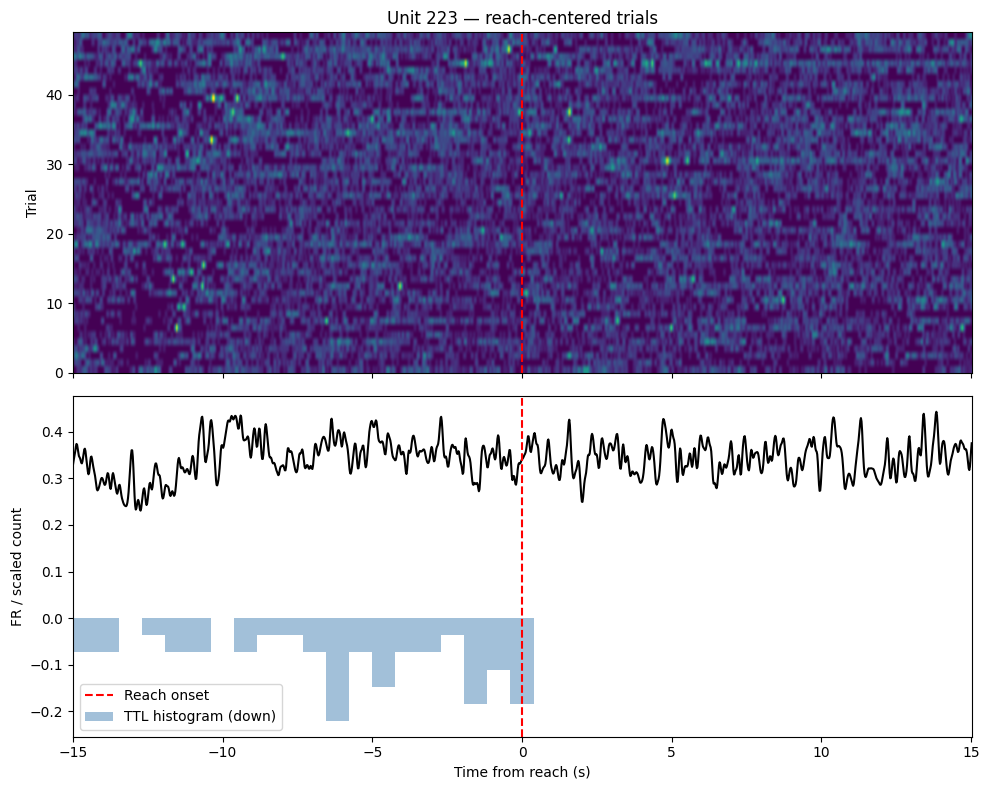

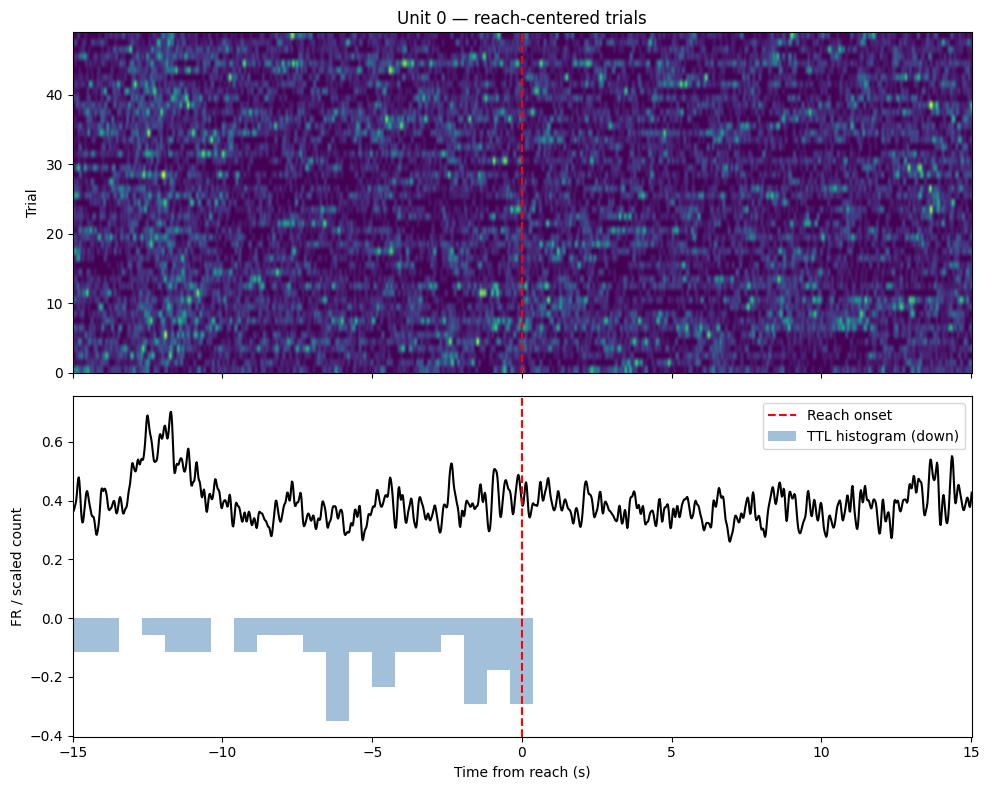

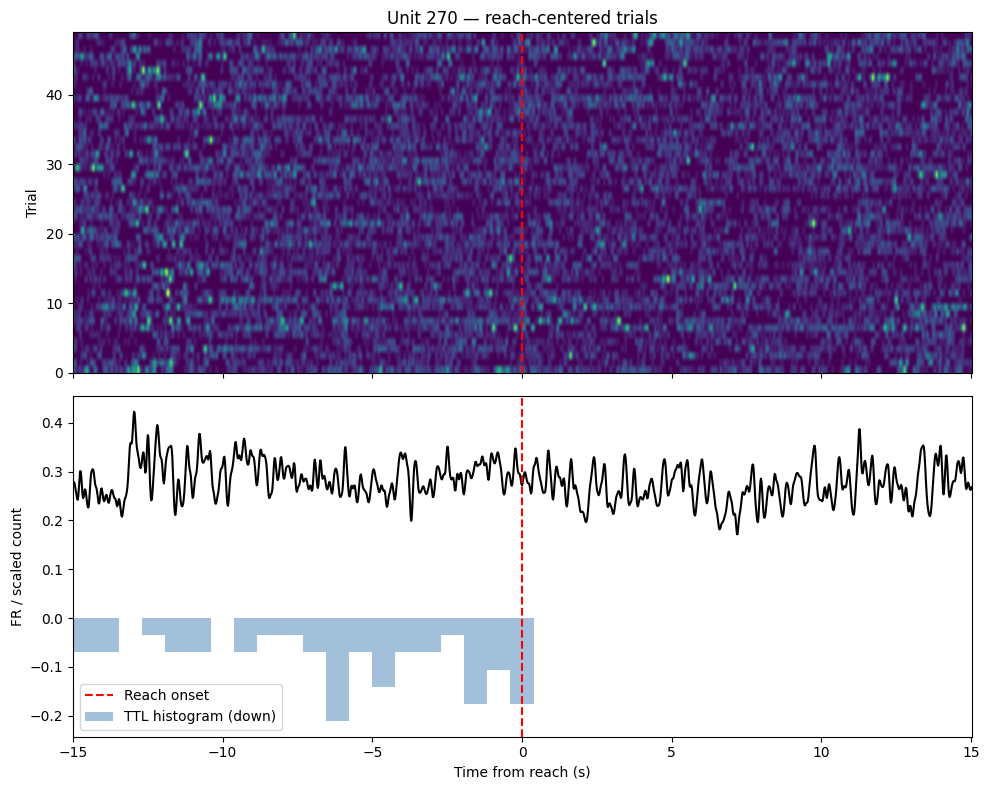

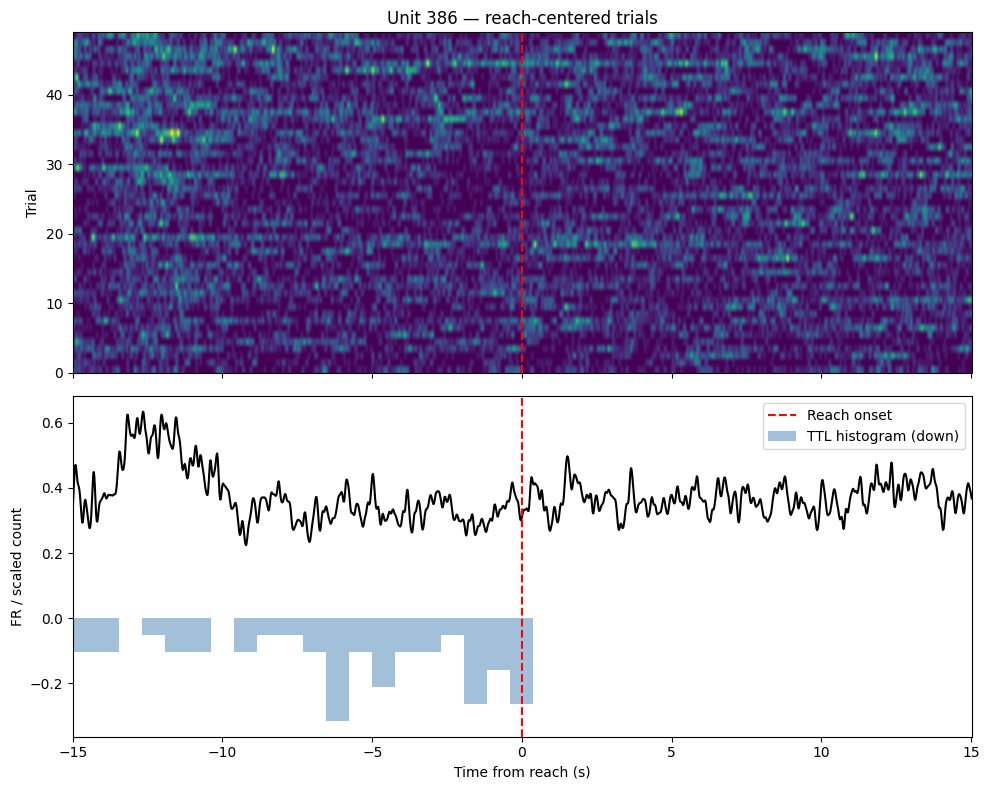

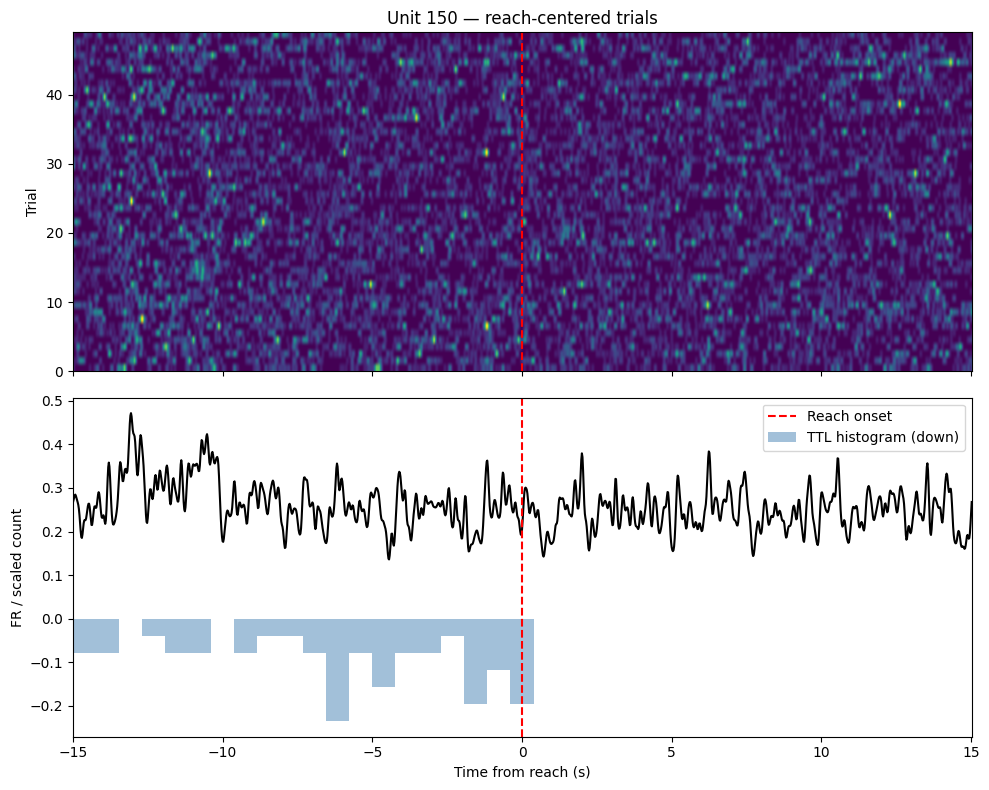

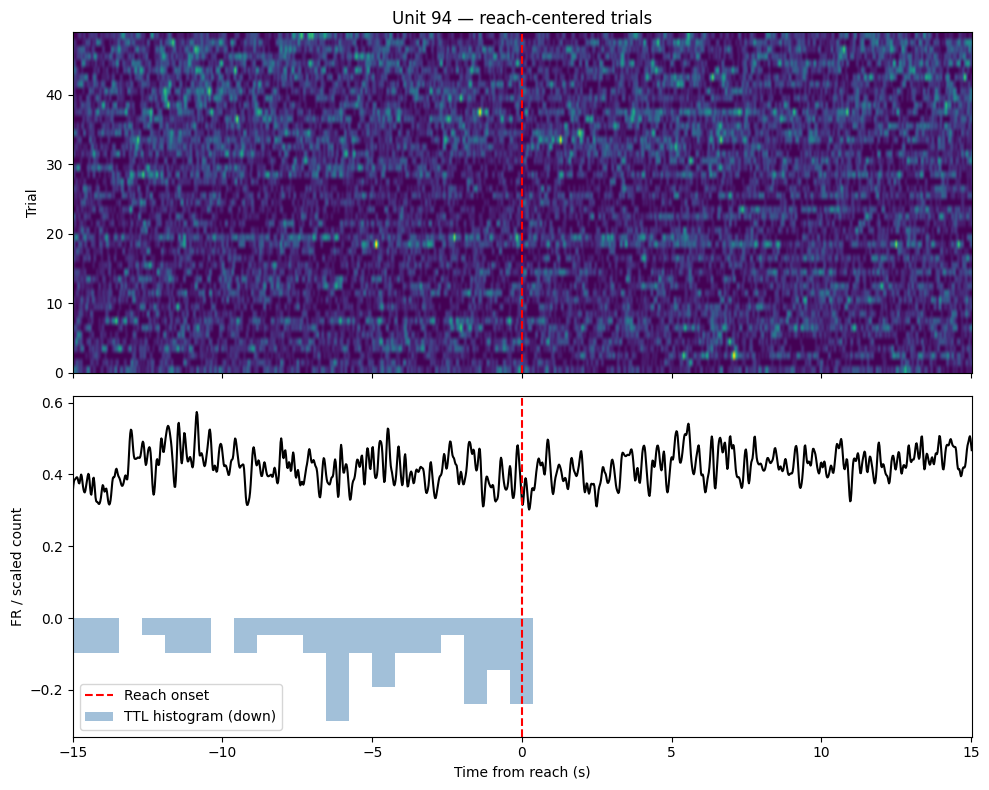

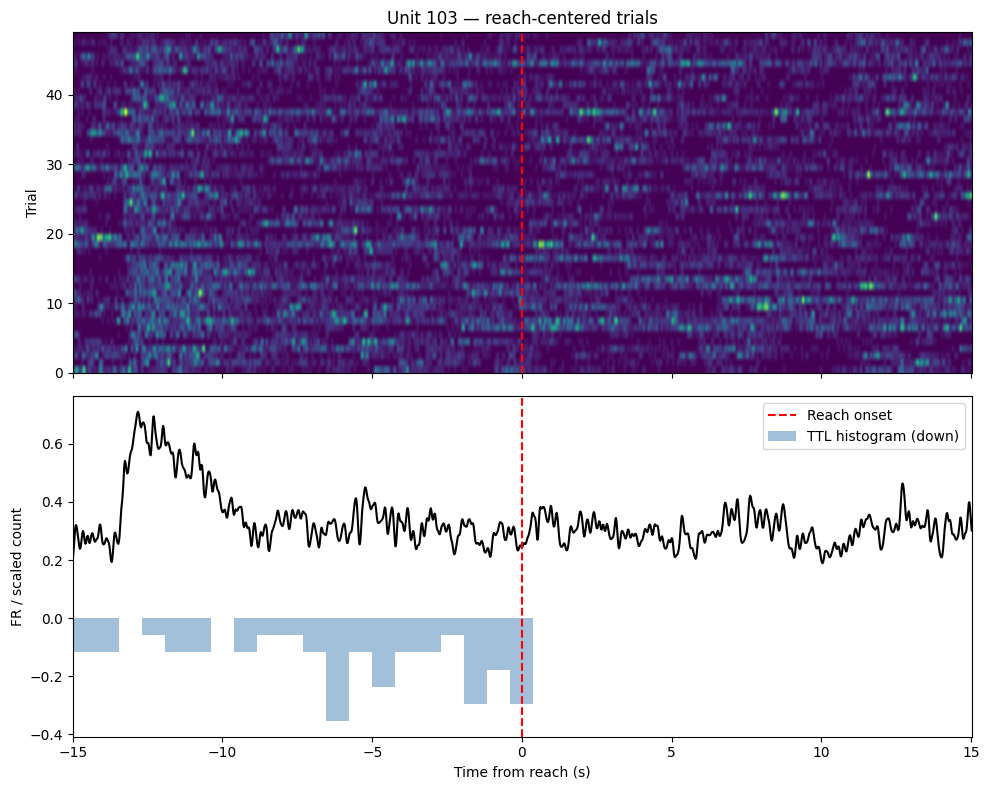

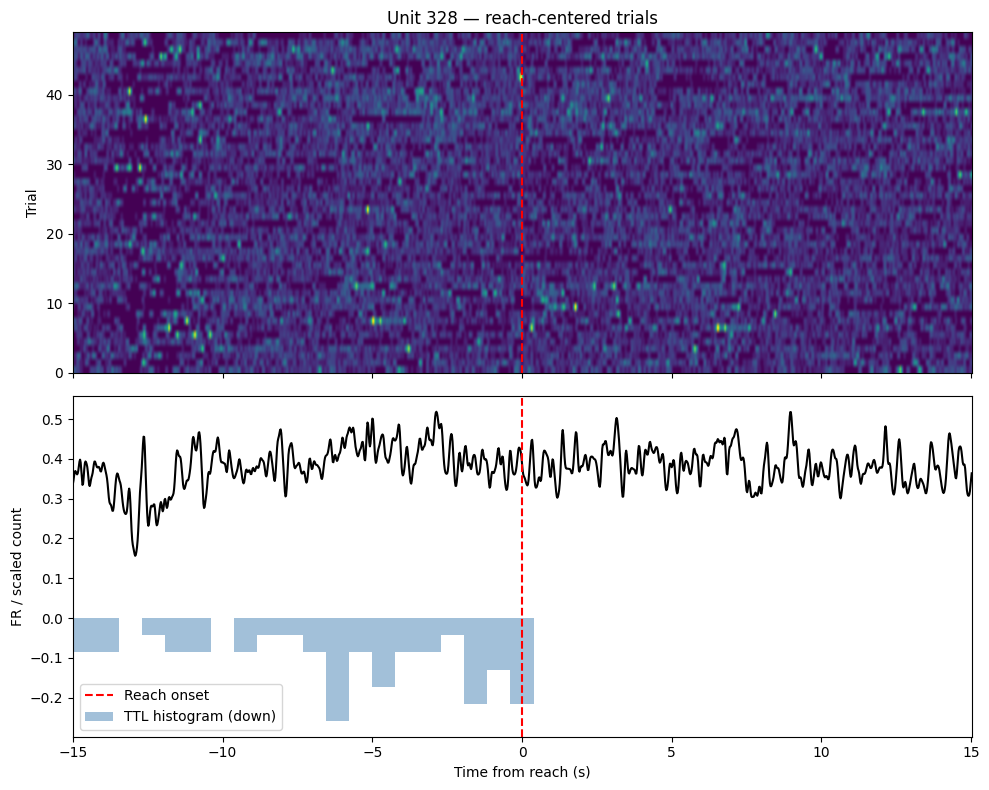

In [53]:
# ============================================================
# ========== SINGLE-UNIT REACH-CENTERED TRIALS ===============
# ============================================================

import numpy as np
import matplotlib.pyplot as plt

print("\n===== Single-unit reach-centered trials =====")

units_of_interest = [384, 250, 223, 0, 270, 386, 150, 94, 103, 328]   ######################################################################################################################################################################
PETH_WIN = 15.0  ##################################################################################################################################################################################################
bin_width = np.median(np.diff(centers))  
peri_bins = np.arange(-PETH_WIN, PETH_WIN + bin_width, bin_width)

# map unit id -> row index
unit_to_idx = {u: i for i, u in enumerate(good_units)}

reach_times = np.array([rc["reach_time"] for rc in kept_reaches])
ttl_times   = np.array([rc["ttl_time"]   for rc in kept_reaches])

for u in units_of_interest:
    if u not in unit_to_idx:
        print(f"Unit {u} not in good_units, skipping.")
        continue

    ui = unit_to_idx[u]
    trials = []

    for rt in reach_times:
        rel_centers = centers - rt
        idxs = np.array([np.argmin(np.abs(rel_centers - tb)) for tb in peri_bins])
        trials.append(rate_matrix[ui, idxs])

    trials = np.array(trials)  # shape: n_trials x n_bins
    mean_trial = trials.mean(axis=0)

    # TTL relative to reach
    lat_reach_ttl = ttl_times - reach_times

    fig, axes = plt.subplots(2, 1, figsize=(10, 8), sharex=True)
    im = axes[0].imshow(
        trials,
        aspect='auto',
        extent=[peri_bins[0], peri_bins[-1], 0, len(trials)],
        origin='lower'
    )
    axes[0].axvline(0, color='red', linestyle='--')
    axes[0].set_ylabel("Trial")
    axes[0].set_title(f"Unit {u} — reach-centered trials")

    axes[1].plot(peri_bins, mean_trial, color='k')
    axes[1].axvline(0, color='red', linestyle='--', label="Reach onset")

    # downward histogram of TTL relative to reach
    bins = np.linspace(-PETH_WIN, PETH_WIN, 40)
    counts, edges = np.histogram(lat_reach_ttl, bins=bins)
    scale = mean_trial.max() * 0.5 / (counts.max() if counts.max() > 0 else 1)
    axes[1].bar(
        edges[:-1],
        -counts * scale,
        width=np.diff(edges),
        align='edge',
        color='steelblue',
        alpha=0.5,
        label="TTL histogram (down)"
    )

    axes[1].set_xlabel("Time from reach (s)")
    axes[1].set_ylabel("FR / scaled count")
    axes[1].legend()

    plt.tight_layout()
    plt.show()

In [45]:
# ============================================================
# ========== CELL F — PORTABLE SANITY CHECK MODULE ===========
# ============================================================

import numpy as np
from pathlib import Path

print("\n===== PORTABLE SANITY CHECK MODULE =====")

camera_dir = analysis_folder / "camera_alignment"
dlc_dir    = analysis_folder / "dlc_alignment"

# Load block metadata
with open(analysis_folder / "metadata" / "block_info.json", "r") as f:
    block_info = json.load(f)

num_blocks = len(block_info)
print(f"Found {num_blocks} blocks to check.\n")

for b in range(num_blocks):

    print(f"\n==============================")
    print(f"Checking block {b}")
    print("==============================")

    # ------------------------------------------------------------
    # Load portable files
    # ------------------------------------------------------------
    aligned_path = camera_dir / f"aligned_frames_block{b}.npy"
    dlc_path     = dlc_dir    / f"dlc_aligned_block{b}.npy"
    ttl_path     = camera_dir / f"ttl_times_block{b}.npy"

    if not aligned_path.exists():
        print(f"❌ Missing aligned_frames file:\n{aligned_path}")
        continue
    if not dlc_path.exists():
        print(f"❌ Missing dlc_aligned file:\n{dlc_path}")
        continue
    if not ttl_path.exists():
        print(f"❌ Missing TTL file:\n{ttl_path}")
        continue

    aligned_frames = np.load(aligned_path, allow_pickle=True)
    dlc_aligned    = np.load(dlc_path, allow_pickle=True)
    ttl_times      = np.load(ttl_path)

    # ------------------------------------------------------------
    # Basic counts
    # ------------------------------------------------------------
    TTL_COUNT = len(ttl_times)
    print(f"TTL count: {TTL_COUNT}")
    print(f"Aligned frames length: {len(aligned_frames)}")
    print(f"DLC-aligned length: {len(dlc_aligned)}")

    if len(aligned_frames) != TTL_COUNT:
        print("⚠️ Mismatch: aligned_frames length != TTL count")

    if len(dlc_aligned) != TTL_COUNT:
        print("⚠️ Mismatch: dlc_aligned length != TTL count")

    # ------------------------------------------------------------
    # Present-frame vs present-DLC check
    # ------------------------------------------------------------
    present_frames = sum(f is not None for f in aligned_frames)
    present_dlc    = sum(x is not None for x in dlc_aligned)

    print(f"Present frames: {present_frames}")
    print(f"Present DLC entries: {present_dlc}")

    if present_frames != present_dlc:
        print("⚠️ Mismatch: DLC entries do not match present frames.")
    else:
        print("✅ DLC entries match present frames exactly.")

    # ------------------------------------------------------------
    # DLC numeric sanity check
    # ------------------------------------------------------------
    # Extract all numeric values from DLC rows
    numeric_vals = []
    for row in dlc_aligned:
        if row is not None:
            # row is a pandas Series
            numeric_vals.extend([v for v in row.values if isinstance(v, (int, float, np.floating))])

    numeric_vals = np.array(numeric_vals, dtype=float)

    if len(numeric_vals) > 0:
        print(f"Min DLC value: {np.nanmin(numeric_vals):.2f}")
        print(f"Max DLC value: {np.nanmax(numeric_vals):.2f}")

        if np.nanmax(numeric_vals) > 5000 or np.nanmin(numeric_vals) < -500:
            print("⚠️ DLC values outside expected pixel range.")
        else:
            print("✅ DLC values within expected pixel range.")
    else:
        print("⚠️ No numeric DLC values found.")

print("\n===== SANITY CHECK COMPLETE =====\n")


===== PORTABLE SANITY CHECK MODULE =====
Found 4 blocks to check.


Checking block 0
TTL count: 11632
Aligned frames length: 11632
DLC-aligned length: 11632
Present frames: 11630
Present DLC entries: 11630
✅ DLC entries match present frames exactly.
Min DLC value: 0.01
Max DLC value: 701.56
✅ DLC values within expected pixel range.

Checking block 1
TTL count: 66686
Aligned frames length: 66686
DLC-aligned length: 66686
Present frames: 58647
Present DLC entries: 58647
✅ DLC entries match present frames exactly.
Min DLC value: -2.98
Max DLC value: 718.05
✅ DLC values within expected pixel range.

Checking block 2
TTL count: 18733
Aligned frames length: 18733
DLC-aligned length: 18733
Present frames: 18132
Present DLC entries: 18132
✅ DLC entries match present frames exactly.
Min DLC value: 0.01
Max DLC value: 704.49
✅ DLC values within expected pixel range.

Checking block 3
TTL count: 67168
Aligned frames length: 67168
DLC-aligned length: 67168
Present frames: 59140
Present DLC entrie

In [54]:
# ============================================================
# ========== EXTRACT NPX SYNC TTLs FROM EVENTS FOLDER ========
# ============================================================

import numpy as np
from pathlib import Path

print("\n===== Extracting NPX Sync TTLs (Pin 5) =====")

# Path to NPX TTL folder
npx_ttl_folder = Path(r"G:\Kevin\2026-03-05_09-27-03\Record Node 101\experiment2\recording1\events\Neuropix-PXI-100.ProbeA\TTL")

# Load NPX TTL arrays
npx_ts = np.load(npx_ttl_folder / "timestamps.npy")
npx_words = np.load(npx_ttl_folder / "full_words.npy")

def rising_edges(words, ts, pin):
    mask = 1 << pin
    bit = (words & mask) > 0
    prev = np.roll(bit, 1)
    prev[0] = False
    rising = (~prev) & bit
    return ts[rising]

# Extract NPX sync pulses on pin 5
npx_sync = rising_edges(npx_words, npx_ts, pin=0)

print(f"Detected {len(npx_sync)} NPX sync pulses on pin x")


===== Extracting NPX Sync TTLs (Pin 5) =====
Detected 3729 NPX sync pulses on pin x


In [55]:
# ============================================================
# ========== COMPUTE NPX → NI-DAQ OFFSET (PIN 0 vs PIN 5) =====
# ============================================================

import numpy as np
from pathlib import Path

print("\n===== ALIGNING NPX CLOCK TO NI-DAQ CLOCK =====")

# ------------------------------------------------------------
# 1. Load NI-DAQ sync pulses (pin 5)
# ------------------------------------------------------------
ni_sync = np.load(analysis_folder / "ttls" / "TTL_Pin_5.npy")
print(f"NI sync pulses (pin 5): {len(ni_sync)}")

# ------------------------------------------------------------
# 2. Load NPX sync pulses (pin 0)
# ------------------------------------------------------------
npx_ttl_folder = Path(
    r"G:\Kevin\2026-03-05_09-27-03\Record Node 101\experiment2\recording1\events\Neuropix-PXI-100.ProbeA\TTL"
)

npx_ts = np.load(npx_ttl_folder / "timestamps.npy")
npx_words = np.load(npx_ttl_folder / "full_words.npy")

def rising_edges(words, ts, pin):
    mask = 1 << pin
    bit = (words & mask) > 0
    prev = np.roll(bit, 1)
    prev[0] = False
    rising = (~prev) & bit
    return ts[rising]

npx_sync = rising_edges(npx_words, npx_ts, pin=0)
print(f"NPX sync pulses (pin 0): {len(npx_sync)}")

# ------------------------------------------------------------
# 3. Compute offset between clocks
# ------------------------------------------------------------
min_len = min(len(ni_sync), len(npx_sync))
offsets = ni_sync[:min_len] - npx_sync[:min_len]
offset = np.median(offsets)

print(f"\nEstimated NPX → NI-DAQ offset: {offset:.6f} seconds")


===== ALIGNING NPX CLOCK TO NI-DAQ CLOCK =====
NI sync pulses (pin 5): 3729
NPX sync pulses (pin 0): 3729

Estimated NPX → NI-DAQ offset: 0.263300 seconds
